# Pipeline for Analyzing Asters

Today we will extract ATP gradients from an aster dataset. Executing the next few cells will import all the relevant data.

## Imports

In [65]:
# # Packages to locally download data into the notebook:
# import requests
# import zipfile
import glob

#Numpy
import numpy as np

#For image plotting
import skimage.io

#Matplotlib plotting packages
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
import matplotlib.colors as mcolors
import matplotlib.cm as cm

#For identifying aster center
from skimage.filters import threshold_otsu, gaussian
from skimage.measure import regionprops
import cv2

#for image registration
from skimage.registration import phase_cross_correlation
import os

# For loading bars
from tqdm.notebook import tqdm as tqdm
import aster_packages

#Movie
import celluloid as cell
import matplotlib.animation as animation

import pandas as pd

from lmfit import minimize, Parameters, fit_report

### plotting

In [2]:
#!/usr/bin/env python
# coding: utf-8

# In[ ]:

# Figure Formatting
import matplotlib.pyplot as plt
import matplotlib as mpl

figwidth = 8
plt.rcParams["figure.figsize"] = [figwidth, figwidth * 1105 / 1920
                                  ]  # figure size in inches
plt.rcParams["lines.linewidth"] = 2  # line width in points
plt.rcParams["font.family"] = "serif"
plt.rcParams["font.serif"] = "Times"

plt.rcParams["font.style"] = "normal"
plt.rcParams["font.weight"] = "heavy"
plt.rcParams["font.size"] = 13.0
plt.rcParams["axes.labelweight"] = "bold"  # weight of the x and y labels
plt.rcParams["axes.spines.right"] = True
plt.rcParams[
    "axes.formatter.useoffset"] = True  # If True, the tick label formatter
plt.rcParams["xtick.major.size"] = 10  # major tick size in points
plt.rcParams["xtick.minor.size"] = 4  # minor tick size in points
plt.rcParams["xtick.direction"] = "in"  # direction in, out, or inout
plt.rcParams["xtick.minor.visible"] = True
plt.rcParams["ytick.major.size"] = 10  # major tick size in points
plt.rcParams["ytick.minor.size"] = 4  # minor tick size in points
plt.rcParams["ytick.direction"] = "in"  # direction in, out, or inout
plt.rcParams["ytick.minor.visible"] = True
plt.rcParams["legend.fontsize"] = 10
plt.rcParams[
    "legend.labelspacing"] = 0.1  # the vertical space between the legend entries in fraction of fontsize
plt.rcParams["legend.shadow"] = False
plt.rcParams[
    "legend.frameon"] = True  # whether or not to draw a frame around legend
plt.rcParams[
    'axes.unicode_minus'] = False  # fix glyph error by using normal hyphens
mpl.rc("figure", dpi=200)

## Initializing Images

Function to convert a list of string file paths into an array of images

In [3]:
def file_to_image(files):
    """
    Takes in a file list and converts to images.
    
    Parameters:
    files: list of file names that you want to read into images
    
    Returns:
    An array of np.int16 images
    """
    im_list = list()
    for file in files:
        im = skimage.io.imread(file)
        im_list.append(im.astype(np.int16))

    return np.array(im_list)

### Specifying files

Specify the directory path to navigate to the data. Additionally, Specify which position you are interested in analyzing as well as the channels

In [4]:
#Choose the experiment file name(located in folder 'Asters'):
file_path = '../../data/aster'
file_folder = '2022-06-28_NCD_ATeam_UMT/2022-06-28_NCD_ATeam_UMT_R4_1'

# #Choose the position(s)/aster(s) of interest:
pos_list = ['Pos1']

#Choose the channels of interest (this is almost always going to be Cherry and iATP)
channel_list = ['GFP', 'CFP', 'Cherry']

#included frames
included_frames = '*2022*.tif'

### Creating image arrays

Combines the specified path information with the function to read files and outputs an array of all the data

In [5]:
# Import images
for pos in pos_list:
    for channel in channel_list:

        #creates an empty list with the naming convention
        exec('im_files' + channel + pos + '= []')
        im_files = eval('im_files' + channel + pos)
        
        #appends all the file names
        im_files.append(
            np.sort(
                glob.glob(file_path + '/' + file_folder + '/' + pos + '/' + channel + '/' +
                          included_frames)))

        #Reads the files as images
        exec('im_array' + channel + pos + ' = file_to_image(im_files[0])')
        print('im_array' + channel + pos)

im_arrayGFPPos1
im_arrayCFPPos1
im_arrayCherryPos1


### Reading camera off images

Include dark, camera off images for camera background subtraction

In [6]:
#Choose the dark ims file name(located in folder 'Asters'):
file_path = '../../data/atp_cal/2022-06-29_ATeam_Cal/2022-06-29_ATeam_Cal_1/images'

bgYFP_name = 'C1-2022-06-29_ATeam_Cal_1_MMStack_Pos6.ome'
bgCFP_name = 'C2-2022-06-29_ATeam_Cal_1_MMStack_Pos6.ome'
bgMot_name = 'C3-2022-06-29_ATeam_Cal_1_MMStack_Pos6.ome'

# im_MT_dark = skimage.io.imread(
#     file_path + '/' + '*C1*.ome.tif'
# ).astype(np.int16)

im_GFP_dark = skimage.io.imread(
    file_path + '/' + bgYFP_name + '.tif'
).astype(np.int16)

im_CFP_dark = skimage.io.imread(
    file_path + '/' + bgCFP_name + '.tif'
).astype(np.int16)

im_Cherry_dark = skimage.io.imread(
    file_path + '/' + bgMot_name + '.tif'
).astype(np.int16)

### Autofluorescence

### Parameter Settings

List of relevant parameters to specify image sizes, um to pixel conversion, etc

In [7]:
#Length Calibration (microns to pixels)
um_per_pixel = 0.59

#Image dims
w_px, h_px = 1920, 1200  #pixels
w_um, h_um = w_px * um_per_pixel, h_px * um_per_pixel  # microns

#min area thresh (IN PIXELS)
area_thresh = 1000

#Fontsize
f_small, f_big = 13, 15

#For binning
winsize = 200
winsize_um = 200 * um_per_pixel
print('winsize: '+str(winsize_um)+' µm (the half width of the final crop)')
thickness = 20
scale = 5

#Total number of imported images per channel
total_frames = len(im_arrayGFPPos1) - 1

winsize: 118.0 µm (the half width of the final crop)


Plot the imported data

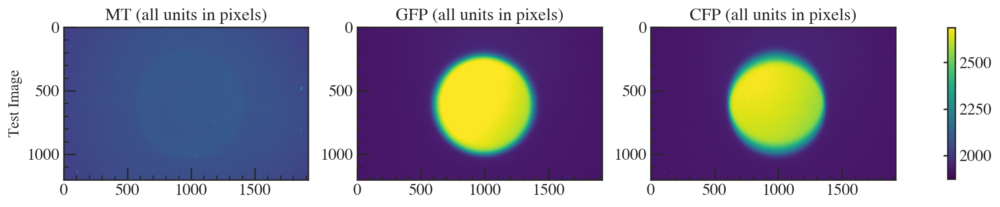

In [8]:
frame = 3
im_CFP = im_arrayCFPPos1[frame]
im_GFP = im_arrayGFPPos1[frame]
im_Cherry = im_arrayCherryPos1[frame]
# im_Cherry = im_Cherry_dark

#define colorbar max and min
colorbar_max = np.percentile(im_CFP, 99)
colorbar_min = np.percentile(im_CFP, 0)

#define plot
fig, ax = plt.subplots(1, 3, figsize=(16, 8))
cmap = cm.get_cmap('viridis')
normalizer = Normalize(colorbar_min, colorbar_max)
cb_setting = cm.ScalarMappable(norm=normalizer)

#define each subplot
ax[0].imshow(im_Cherry, vmin = colorbar_min, vmax = colorbar_max)
ax[0].set_title('MT (all units in pixels)', fontsize=f_big)
ax[0].set_ylabel('Test Image', fontsize=f_small)

ax[1].imshow(im_GFP, vmin = colorbar_min, vmax = colorbar_max)
ax[1].set_title('GFP (all units in pixels)', fontsize=f_big)

ax[2].imshow(im_CFP, vmin = colorbar_min, vmax = colorbar_max)
ax[2].set_title('CFP (all units in pixels)', fontsize=f_big)

fig.colorbar(cb_setting, ax=ax.ravel().tolist(), shrink = 0.3)

## Image corrections

### Subtract the camera background image

Subtract the dark camera image from each image and the autofluorescent image. If there are any negative values, set them to zero

In [9]:
# subtracting bg image
im_arrayGFPPos1_bs = im_arrayGFPPos1 - im_GFP_dark
im_arrayCFPPos1_bs = im_arrayCFPPos1 - im_CFP_dark
im_arrayCherryPos1_bs = im_arrayCherryPos1 - im_Cherry_dark
# im_Cherry_autofluor_bs = im_Cherry_autofluor - im_Cherry_dark

# Set negative values to zero
bool_array = (im_arrayGFPPos1_bs > 0)
im_arrayGFPPos1_bs_nonneg = im_arrayGFPPos1_bs * bool_array

bool_array = (im_arrayCFPPos1_bs > 0)
im_arrayCFPPos1_bs_nonneg = im_arrayCFPPos1_bs * bool_array

bool_array = (im_arrayCherryPos1_bs > 0)
im_arrayCherryPos1_bs_nonneg = im_arrayCherryPos1_bs * bool_array

# bool_array = (im_Cherry_autofluor_bs > 0)
# im_Cherry_autofluor_bs_nonneg = im_Cherry_autofluor_bs * bool_array

### Normalize Images

This corrects for uneven illumination. The light gradient that comes from instrumentation "should" be the same for each frame. Here, take the first frame of the image sequence and create a normalization matrix. This matrix is created by dividing each pixel in the image by the maximum pixel value, so that when you multiply the original image by the normalization matrix, the first frame will be a homogeneous image with the highest pixel value. All future frames can be multiplied by the matrix to remove the systematic light gradient

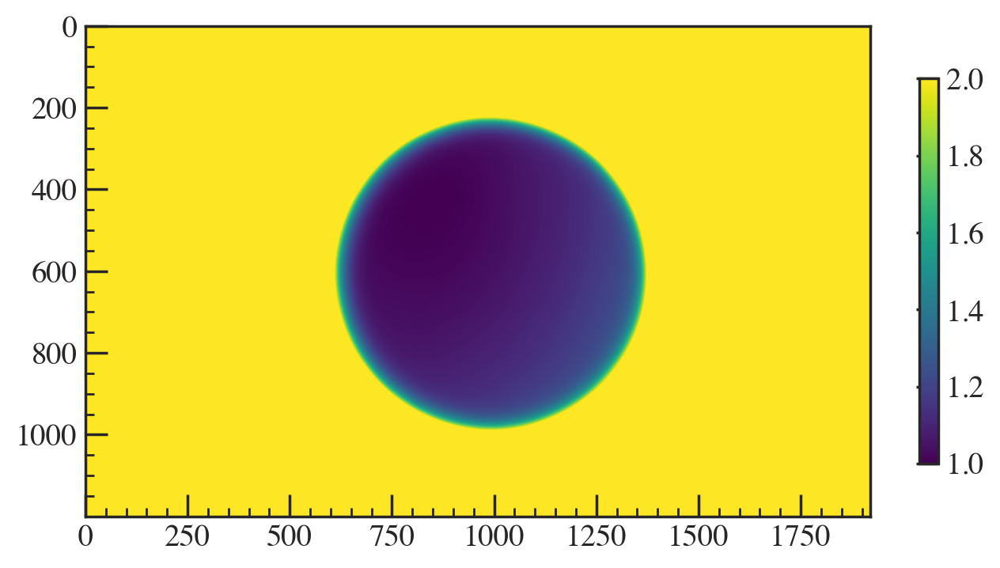

In [10]:
#Set the first imaga as the sacrificial normalization image
GFP_zero = im_arrayGFPPos1[0]
CFP_zero = im_arrayCFPPos1[0]
Cherry_zero = im_arrayCherryPos1[0]

# Create the normalization matrix
GFP_norm_mat = aster_packages.norm_mat_fn_iATP(GFP_zero, im_GFP_dark)
CFP_norm_mat = aster_packages.norm_mat_fn_iATP(CFP_zero, im_CFP_dark)
Cherry_norm_mat = aster_packages.norm_mat_fn_iATP(Cherry_zero, im_Cherry_dark)

#Plot the normalization matrix
plt.imshow(GFP_norm_mat, vmin = 1, vmax = 2)
plt.colorbar(shrink = 0.7)

Multiply the image stacks by a binary image and then the normalization matrix:

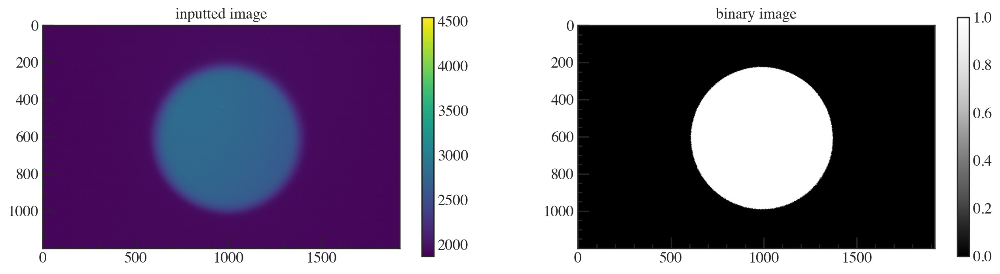

In [11]:
#Ensure all pixels are floats
im_arrayGFPPos1_bs_nonneg = im_arrayGFPPos1_bs_nonneg.astype(float)
im_arrayCFPPos1_bs_nonneg = im_arrayCFPPos1_bs_nonneg.astype(float)
im_arrayCherryPos1_bs_nonneg = im_arrayCherryPos1_bs_nonneg.astype(float)

#Multiply by a binary mask that only retains non-zero values for inside the roi
im_binary = aster_packages.binary_im_generator(GFP_zero)
GFP_norm_mask = GFP_norm_mat * im_binary
CFP_norm_mask = CFP_norm_mat * im_binary

# Multiply the images by the normalization matrix
im_arrayGFPPos1_bs_norm = GFP_norm_mask * im_arrayGFPPos1_bs_nonneg
im_arrayCFPPos1_bs_norm = CFP_norm_mask * im_arrayCFPPos1_bs_nonneg
im_arrayCherryPos1_bs_norm = Cherry_norm_mat*im_arrayCherryPos1_bs_nonneg


### Photobleaching correction

0it [00:00, ?it/s]

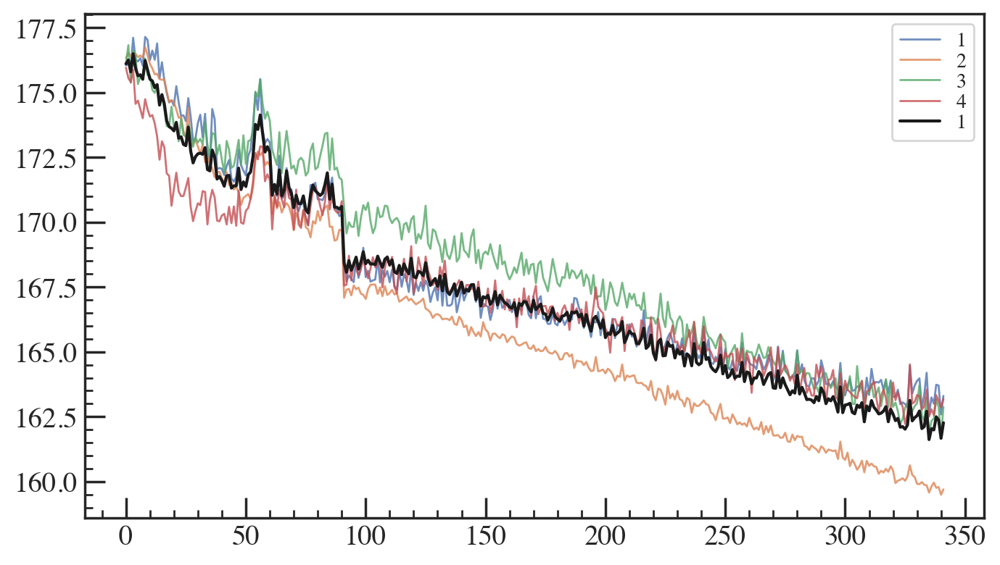

In [12]:
avg1 = np.zeros(len(im_arrayCherryPos1_bs_norm))
avg2 = np.zeros(len(im_arrayCherryPos1_bs_norm))
avg3 = np.zeros(len(im_arrayCherryPos1_bs_norm))
avg4 = np.zeros(len(im_arrayCherryPos1_bs_norm))
edgeCherryavg = np.zeros(len(im_arrayCherryPos1_bs_norm))

for i, im in tqdm(enumerate(im_arrayCherryPos1_bs_norm)):
    avg1[i] += np.average(im[:, :300])
    avg2[i] += np.average(im[:, -300:])
    avg3[i] += np.average(im[:150, :])
    avg4[i] += np.average(im[-150:, :])
    edgeCherryavg[i] += np.average([avg1[i], avg2[i], avg3[i], avg4[i]])

plt.plot(np.arange(len(edgeCherryavg)), avg1, label = '1', alpha=0.8, linewidth=1)
plt.plot(np.arange(len(edgeCherryavg)), avg2, label = '2', alpha=0.8, linewidth=1)
plt.plot(np.arange(len(edgeCherryavg)), avg3, label = '3', alpha=0.8, linewidth=1)
plt.plot(np.arange(len(edgeCherryavg)), avg4, label = '4', alpha=0.8, linewidth=1)
plt.plot(np.arange(len(edgeCherryavg)), edgeCherryavg, label = '1', color = 'k', linewidth=1.5)
plt.legend();


In [13]:
bleach_correction = edgeCherryavg[0]/edgeCherryavg
bleach_correction_ims = np.ones((len(bleach_correction), h_px, w_px))
for i, im in enumerate(tqdm(bleach_correction_ims)):
    bleach_correction_ims[i] *= im*bleach_correction[i] 
im_arrayCherryPos1_bs_norm_bleach = im_arrayCherryPos1_bs_norm*bleach_correction_ims

  0%|          | 0/342 [00:00<?, ?it/s]

  0%|          | 0/342 [00:00<?, ?it/s]

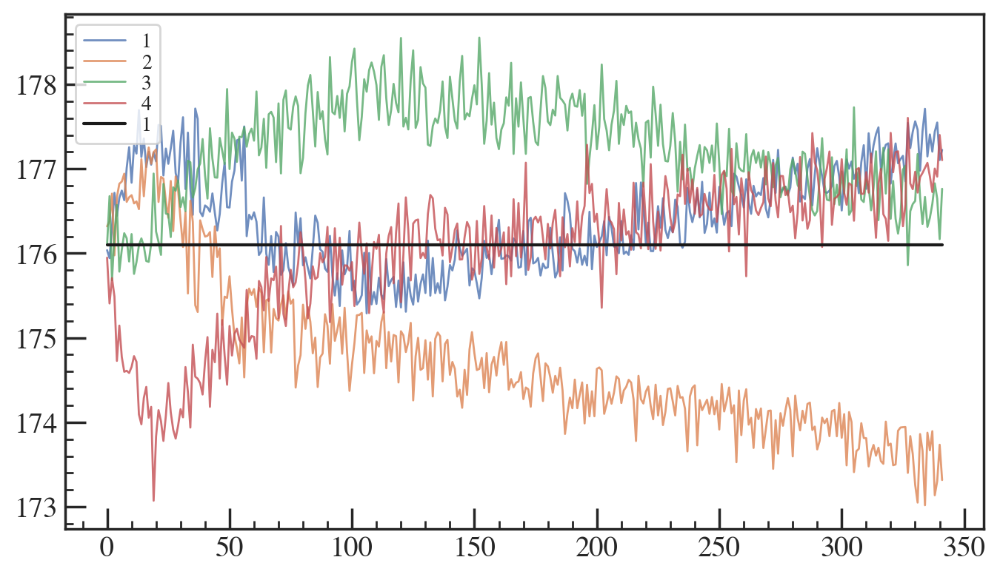

In [14]:
avg5 = np.zeros(len(im_arrayCherryPos1_bs_norm))
avg6 = np.zeros(len(im_arrayCherryPos1_bs_norm))
avg7 = np.zeros(len(im_arrayCherryPos1_bs_norm))
avg8 = np.zeros(len(im_arrayCherryPos1_bs_norm))
edgeCherryavg1 = np.zeros(len(im_arrayCherryPos1_bs_norm))

for i, im in enumerate(tqdm(im_arrayCherryPos1_bs_norm_bleach)):
    avg5[i] += np.average(im[:, :300])
    avg6[i] += np.average(im[:, -300:])
    avg7[i] += np.average(im[:150, :])
    avg8[i] += np.average(im[-150:, :])
    edgeCherryavg1[i] += np.average([avg5[i], avg6[i], avg7[i], avg8[i]])


plt.plot(np.arange(len(edgeCherryavg)), avg5, label = '1', alpha=0.8, linewidth=1)
plt.plot(np.arange(len(edgeCherryavg)), avg6, label = '2', alpha=0.8, linewidth=1)
plt.plot(np.arange(len(edgeCherryavg)), avg7, label = '3', alpha=0.8, linewidth=1)
plt.plot(np.arange(len(edgeCherryavg)), avg8, label = '4', alpha=0.8, linewidth=1)
plt.plot(np.arange(len(edgeCherryavg)), edgeCherryavg1, label = '1', color = 'k', linewidth=1.5)
plt.legend();


### Establish protein per fluor

In [15]:
protein_per_fluo = 1.24/np.average(im_arrayCherryPos1_bs_norm_bleach[0])/1.24 #µM

### Center (w/ Gaussian blur)

Define a crop window

In [16]:
c_ymin, c_ymax, c_xmin, c_xmax = 100, 900, 700, 1500
crop = np.s_[c_ymin:c_ymax, c_xmin:c_xmax]

Find what the center values are for all the images by taking a gaussian blur, finding the contour of the center above a threshold, enclosing the threshold in a circle and take the center.

In [17]:
#init empty lists for center vals, radius, frame #
centers_tc = []
radii = []
frame_num = []
contours_plot = []

#for loop thru MT images
for i, im in enumerate(tqdm(im_arrayCherryPos1_bs_norm)):
   
    #gaussian blur
    dst = gaussian(im[crop], sigma=50)
    
    #Create a binary mask for above a threshold
    thresh = threshold_otsu(dst) #Otsu threshold method
#     thresh = np.percentile(dst, 98.5) #Percentile threshold method
    binary = (dst>thresh).astype(np.uint8)
    
    #create a contour
    contours, hierarchy = cv2.findContours(binary, 1, 2)

    #iterate through contours (for most connected region)
    max_area = 0
    max_index = None

    #Find the contour that encomppasses the largest area, this will be 
    #the best center circle guess
    for j, contour in enumerate(contours):
        area = cv2.contourArea(contour)
        if area > max_area:
            max_area = area
            max_index = j

    #Conditional to find the center - only look if the contour is bigger
    #than a threshold radius defined above
    if (max_area >= area_thresh and i > 10):
        cnt = contours[max_index]
        #Find a circle that best encloses the contour
        (x, y), radius = cv2.minEnclosingCircle(cnt)
        #save the center, radii, and frame number
        centers_tc.append([x + c_xmin, y + c_ymin])
        radii.append(radius)
        frame_num.append(i)
        
        #fromat the contour indices for plotting
        cnt = np.array(cnt)
        cnt = np.squeeze(cnt)
        cnt[:,0] += c_xmin
        cnt[:,1] += c_ymin
        contours_plot.append(cnt)
    
    #If the contour is not well defined for the image, abort
    else:
        print("**CENTER NOT FOUND** - Frame " + str(i))
        cnt = contours[max_index]
        (x, y), radius = cv2.minEnclosingCircle(cnt)
        centers_tc.append([x + c_xmin, y + c_ymin])
        radii.append(radius)
#         frame_num.append(i)
        
        cnt = np.array(cnt)
        cnt = np.squeeze(cnt)
        cnt[:,0] += c_xmin
        cnt[:,1] += c_ymin
        contours_plot.append(cnt)

#Convert lists to arrays
centers_tc = np.array(centers_tc)
radii = np.array(radii)
frame_num = np.array(frame_num)

  0%|          | 0/342 [00:00<?, ?it/s]

**CENTER NOT FOUND** - Frame 0
**CENTER NOT FOUND** - Frame 1
**CENTER NOT FOUND** - Frame 2
**CENTER NOT FOUND** - Frame 3
**CENTER NOT FOUND** - Frame 4
**CENTER NOT FOUND** - Frame 5
**CENTER NOT FOUND** - Frame 6
**CENTER NOT FOUND** - Frame 7
**CENTER NOT FOUND** - Frame 8
**CENTER NOT FOUND** - Frame 9
**CENTER NOT FOUND** - Frame 10


If the images were cropped when definining the center, convert the centers back to full image coordinates

In [18]:
centers = []
for center in centers_tc:
    center_x = int(center[0])
    center_y = int(center[1])
    centers.append([center_x, center_y])
centers = np.array(centers)

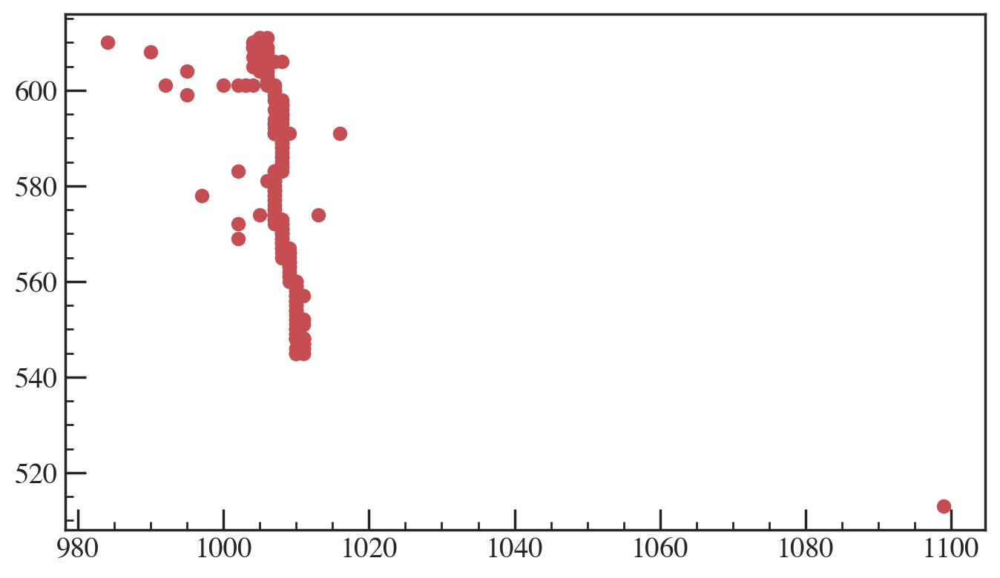

In [19]:
#TEST: plotting all centers

plt.figure()

for i in range(np.shape(centers)[0]):
    plt.scatter(centers[i, 0], centers[i, 1], color='r')

# plt.xlim(800, 1200)
# plt.ylim(400, 700)

## Making video

## Register

Register images

In [20]:
#Empty list to record how much CFP (probe) channel is shifted w.r.t. GFP (ATP is bound) channel
shifts = []

for i in range(len(im_arrayGFPPos1_bs_norm)):
    shift, error, _ = phase_cross_correlation(
        im_arrayGFPPos1_bs_norm[i][crop], im_arrayCFPPos1_bs_norm[i][crop])
    shifts.append(shift)

shifts = np.array(shifts)

## Getting plotting data

  0%|          | 0/331 [00:00<?, ?it/s]

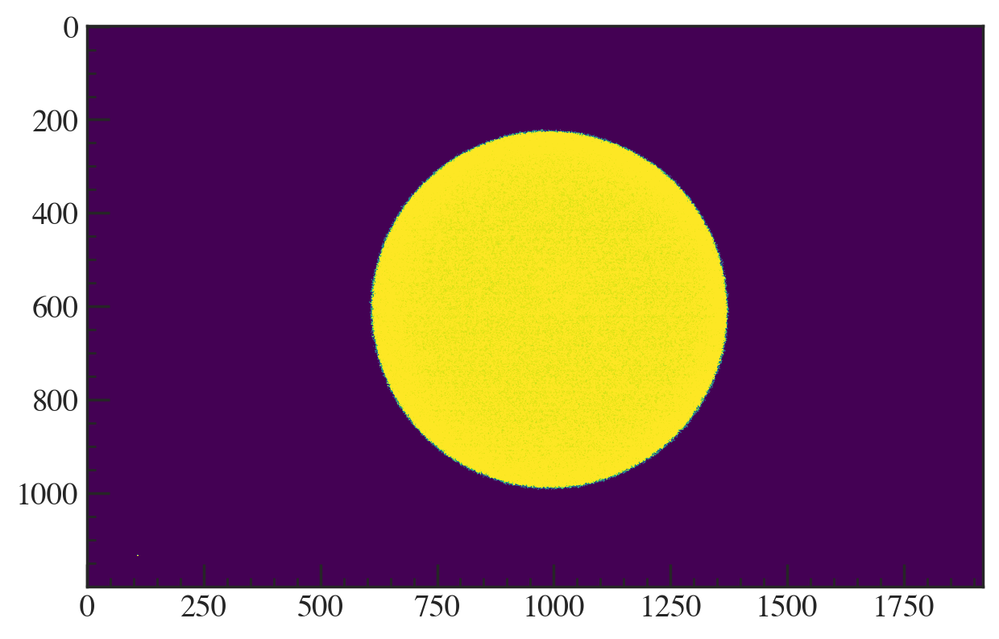

In [21]:
#cropped aster images
im_arrayGFPPos1_plot = []
im_arrayCFPPos1_plot = []
im_arrayCherryPos1_plot = []

ratios_plot = []

#Traces for asters
GFP_trace_pts = []
CFP_trace_pts = []
Cherry_trace_pts = []

ratios_trace_pts = []

for i in tqdm(frame_num):
    i_min = int(centers[i][0] - winsize)
    i_max = int(centers[i][0] + winsize)
    j_min = int(centers[i][1] - winsize)
    j_max = int(centers[i][1] + winsize)

    #demi-variable for shift
#     shift_j = int(shifts[i][0])
#     shift_i = int(shifts[i][1])

    shift_j = 0
    shift_i = 0
    
    #set GFP and CFP windows
    winGFP = np.s_[j_min:j_max, i_min:i_max]
    winCFP = np.s_[(j_min - shift_j):(j_max - shift_j),
                   (i_min - shift_i):(i_max - shift_i)]
    winCherry = np.s_[j_min:j_max, i_min:i_max]
    im_temp = im_arrayGFPPos1_bs_norm[i]
    plt.imshow(im_temp, vmin=0, vmax=np.percentile(im_temp, 90))
    
    #Append the plotting images
    [h, w] = np.shape(im_arrayGFPPos1_bs_norm[i])
    
    im_arrayGFPPos1_plot.append(im_arrayGFPPos1_bs_norm[i][winGFP])
    im_arrayCFPPos1_plot.append(im_arrayCFPPos1_bs_norm[i][winCFP])
    im_arrayCherryPos1_plot.append(im_arrayCherryPos1_bs_norm_bleach[i][winCherry]) #CHANGED TO BLEACH HERE
    #for now MT same as CFP shifts, running the shift cell seems closest to CFP

    ratio = im_arrayGFPPos1_bs_norm[i][winGFP] / im_arrayCFPPos1_bs_norm[i][winCFP]
    ratios_plot.append(ratio)

im_arrayGFPPos1_plot = np.array(im_arrayGFPPos1_plot)
im_arrayCFPPos1_plot = np.array(im_arrayCFPPos1_plot)
ratios_plot = np.array(ratios_plot)

pos_xaxis = np.linspace(-winsize, winsize, 2 * winsize)

## Convert to concentration units

In [22]:
def ATP_inten_to_conc(array, a, b, c, d):
    return a * ((c - array) / (array - b)) ** (1/d)

In [23]:
def calibrate_motor(output_Cherry, protein_per_fluo):
    """
    Calibrate a fluorescence image using the normalization matrix and
    the intensity calibration factor.
    
    Parameters
    ----------
    im : numpy array
        Image to be calibrated.
    
    norm_mat : numpy array
        Normalization matrix.
        
    offset_camera : float
        Camera offset (not accounting for autofluorescence).
        
    auto_fluo : float
        Autofluorescence (coming from the energy mix).
        
    protein_per_fluo : float
        Calibration factor for converting fluorescence units
        into protein concentration units.
        
    Returns
    -------
    im : numpy array
        Calibrated image.
    """
    
    output_Cherry = output_Cherry * protein_per_fluo
    return output_Cherry

## grid setup

###### Define the frames/times to use in the following analysis

In [24]:
#Define a cut off for the calibration curve data
times = frame_num * 20 / 60  #min
included = np.s_[:]#int(np.where(times==25)[0])] #remove nan where low data in calibration curve

#Define the frames to plot
plot_frames = frame_num[included]
plot_times = times[included] #min
color_background = '#E5E0D5'

Convert all intensity images to concentration

In [25]:
lowest = 1
highest = 0
index_l = 0
index_h = 0
for i in range(len(ratios_plot)):
    val = np.average(ratios_plot[i])
    if val<lowest:
        lowest=val
        index_l = i
    if val>highest:
        highest=val
        index_h=i
print(index_l, lowest)
print(index_h, highest)

329 0.7649801531589919
0 1.0108630622340582


In [26]:
print(np.percentile(ratios_plot[0], 10))
print(np.percentile(ratios_plot[-1], 10))
print(np.mean(ratios_plot[-1]))

0.9468029023908704
0.7161934429686734
0.766361346632363


Text(0.5, 0, 'ratio')

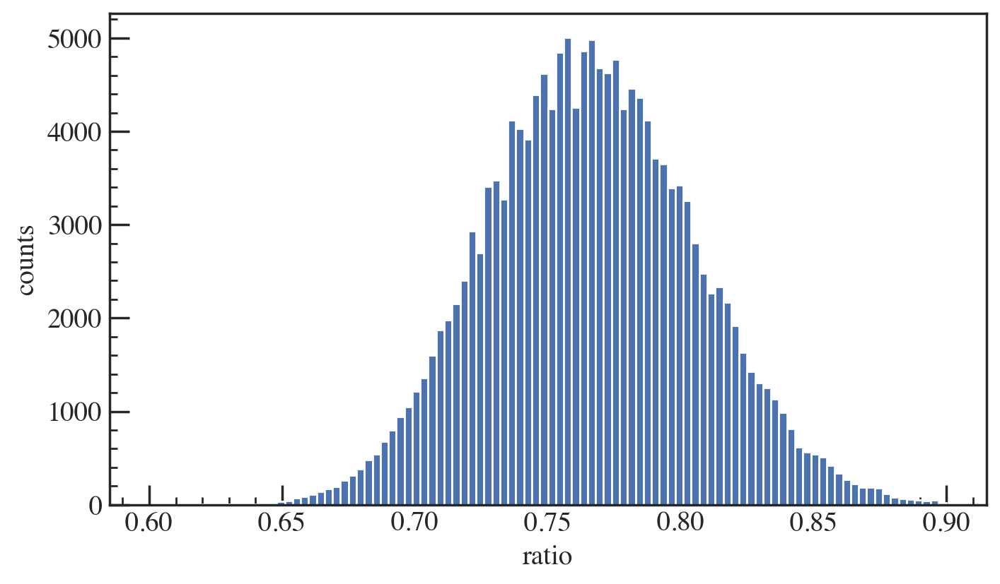

In [27]:
plt.hist(np.ndarray.flatten(ratios_plot[-1]), 100, range=(0.6, 0.9));
plt.ylabel('counts')
plt.xlabel('ratio')

In [28]:
### Define the motor data to work with and convert to concentration
ims_cherry = im_arrayCherryPos1_plot[included]
ims_cherry_conc = []
for im in tqdm(ims_cherry):
    im_conc = calibrate_motor(im, protein_per_fluo)
    ims_cherry_conc.append(im_conc)

# #Define the atp data to work with and convert to concentration
# ims_atp = ratios_plot
# ims_atp_conc = []
# for im in tqdm(ims_atp):
#     im_conc = ATP_inten_to_conc(im, 742,   1.49,   0.78,   2.02)
#     #im_conc = ATP_inten_to_conc(im, 780.129963, 1.53561986, 0.771962585, 1.83636547)
#     ims_atp_conc.append(im_conc)

  0%|          | 0/331 [00:00<?, ?it/s]

Look for conservation of matter by taking the average of the concentration over the full image:

In [29]:
#average full images to get total motor and atp material in the frames
total_cherry_conc = []
#total_atp_conc = []

for i in range(len(ims_cherry_conc)):
    total_cherry_conc.append(np.nanmean(ims_cherry_conc[i]))
    #total_atp_conc.append(np.nanmean(ims_atp_conc[i]))

Plot concentration vs. time for full image (no bins)

Establish bins and calculate the radii

In [30]:
# Set bin widths
binlen = 10
binlen_um = binlen*um_per_pixel
bins_per_axis = int((winsize*2/binlen))
imshape = np.shape(im_arrayCherryPos1_plot[0])

# Define arrays for the bin centers and radii
bin_centers = np.zeros((bins_per_axis, bins_per_axis, 2))
bin_radius = np.zeros((bins_per_axis, bins_per_axis))
for i in range(bins_per_axis):
    for j in range(bins_per_axis):
        bincent = [binlen*(i+0.5), binlen*(j+0.5)]
        binradius = np.sqrt(((bincent[0]-200)**2)+((bincent[1]-200)**2))
        bin_centers[i,j] += bincent
        bin_radius[i,j] += binradius
bin_radii_unique = np.unique(bin_radius)

Plot the bin centers over an image

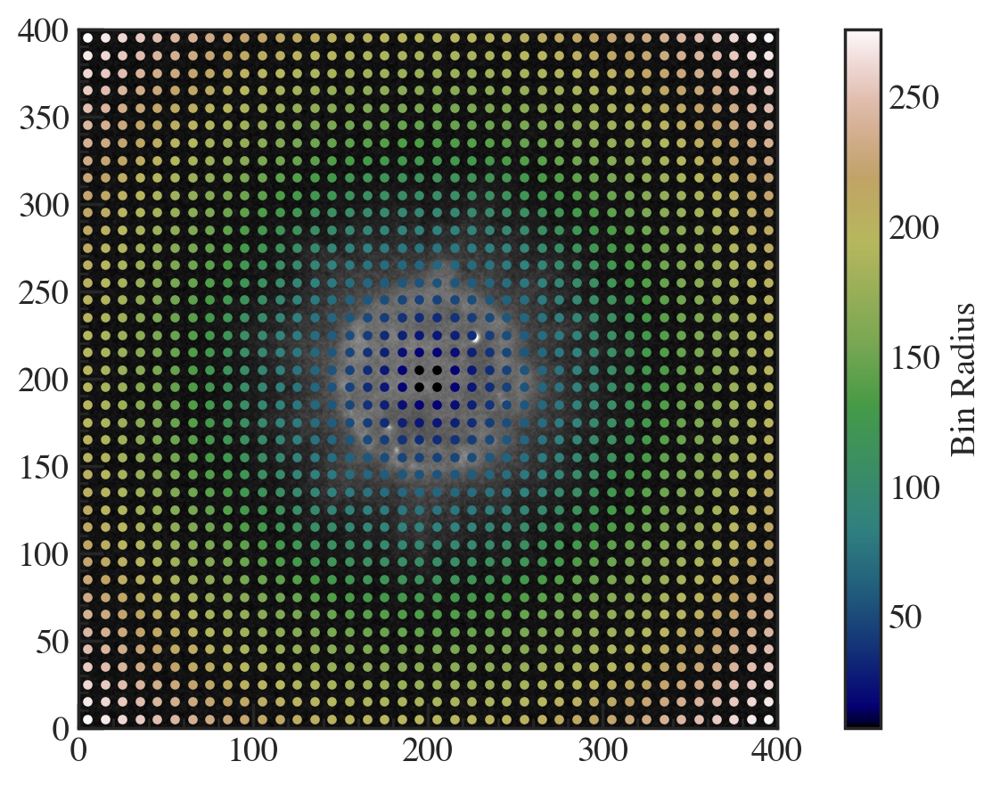

In [31]:
# setup the normalization and the colormap
normalize = mcolors.Normalize(vmin=bin_radii_unique.min(), vmax=bin_radii_unique.max())
colormap = cm.gist_earth

plt.imshow(im_arrayCherryPos1_plot[139], cmap='Greys_r')#, vmin = np.percentile(ratios_plot[0], 0), vmax = np.percentile(ratios_plot[0], 100), cmap='Greys_r')
for i in range(len(bin_centers)):
    for j in range(len(bin_centers)):
        plt.scatter(bin_centers[i][j][0], 
                bin_centers[i][j][1], 
                s = 8, 
                color = colormap(normalize(bin_radius[i][j])))
plt.ylim(0,400)
plt.xlim(0,400)

#setup the colorbar
scalarmappaple = cm.ScalarMappable(norm=normalize, cmap=colormap)
scalarmappaple.set_array(bin_radii_unique)
cbar = plt.colorbar(scalarmappaple, label = "Bin Radius")
#cbar.set_label('Time (s)', rotation=270)
plt.tight_layout()

### Define Concentrations Per Bin

In [32]:
#Set arrays for concentrations per bin
bin_cherry_conc = np.zeros((bins_per_axis, bins_per_axis, len(plot_frames)))
bin_atp_ratio = np.zeros((bins_per_axis, bins_per_axis, len(plot_frames)))

#Determine concentrations per bin
for i in range(bins_per_axis):
    
    for j in range(bins_per_axis):
        
        i_min = int(bin_centers[i][j][0]-binlen/2)
        i_max = int(bin_centers[i][j][0]+binlen/2)
        j_min = int(bin_centers[i][j][1]-binlen/2)
        j_max = int(bin_centers[i][j][1]+binlen/2)
        bin_win = np.s_[i_min:i_max, j_min:j_max]
            
        for im_index in range(len(ims_cherry_conc[included])):
            
            bin_cherry_conc[i][j][im_index] += (np.average(ims_cherry_conc[im_index][bin_win]))
            bin_atp_ratio[i][j][im_index] += (np.nanmean(ratios_plot[im_index][bin_win]))

## Smooth ATP images with a gaussian filter

In [33]:
bin_atp_ratio_smoo = np.zeros((len(plot_frames), bins_per_axis, bins_per_axis))
for i, im in enumerate(np.transpose(bin_atp_ratio)):
    bin_atp_ratio_smoo[i] = skimage.filters.gaussian(im, sigma = 2)
bin_atp_ratio_smoo = np.transpose(bin_atp_ratio_smoo)

### convert ATP ratios to concentrations/bin

convert bin ratio values to concentrations

  0%|          | 0/331 [00:00<?, ?it/s]

/var/folders/8p/dg75nl0d7ml8f_vqy6lvm3740000gn/T/ipykernel_41903/1203200823.py:2: RuntimeWarning: invalid value encountered in power
  return a * ((c - array) / (array - b)) ** (1/d)


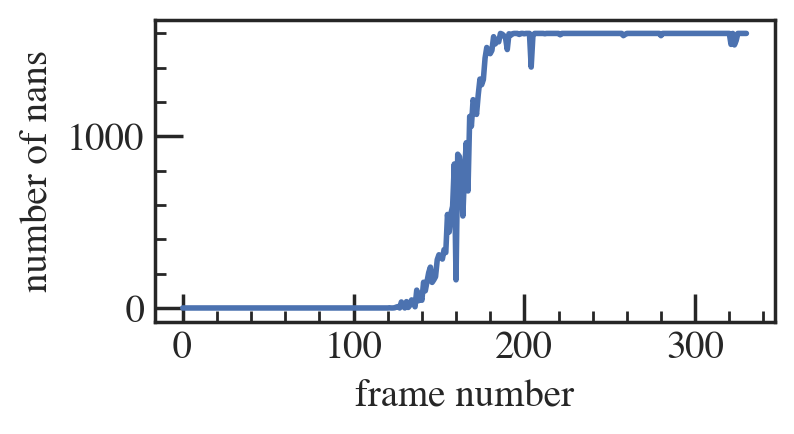

In [34]:
#Convert bins of ratios to ATP concentrations. 
ims_atp = np.transpose(bin_atp_ratio_smoo)
bin_atp_conc = []
for im in tqdm(ims_atp):
    bins_conc = ATP_inten_to_conc(im, 742,  1.49,   0.78,   2.02)
    bin_atp_conc.append(bins_conc)

#---#
#Plot the nans to see the distribution. If there are most nans at the end, 
#then it should be ok to set them to zero - likely the ratio is lower than 
#the calibration curve

numnan = []
for t in bin_atp_conc:
    num = np.sum(np.isnan(t))
    numnan.append(num)

fig, ax = plt.subplots(figsize = (4,2))
ax.plot(np.arange(len(numnan)), numnan);
plt.ylabel('number of nans')
plt.xlabel('frame number')


#---#
#Transpose the data and set nans to zero

bin_atp_conc = np.transpose(bin_atp_conc)
bin_atp_conc[np.isnan(bin_atp_conc)] = 0

Plot concentrations vs time for each bin
2d array style

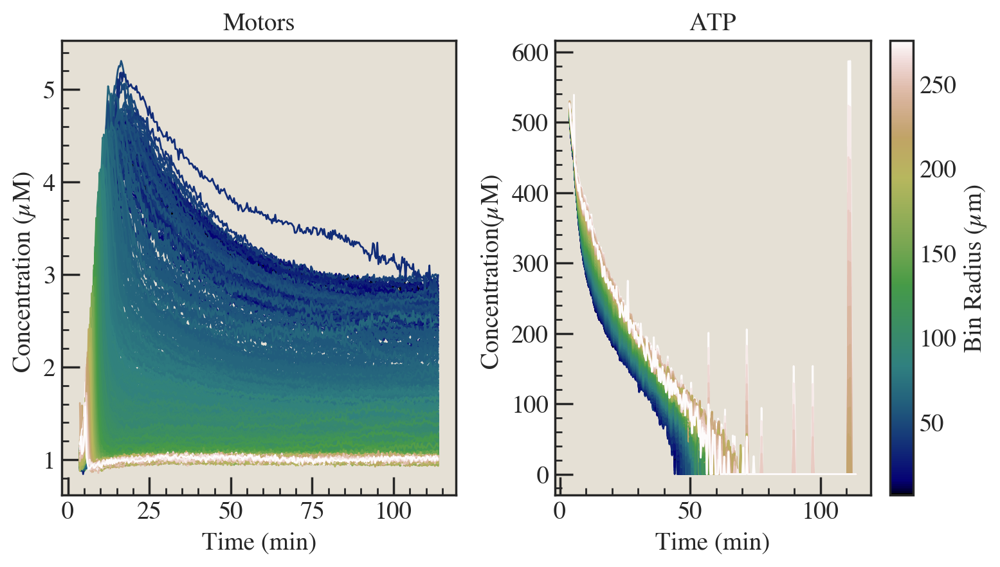

In [35]:
# setup the normalization and the colormap
normalize = mcolors.Normalize(vmin=bin_radii_unique.min(), vmax=bin_radii_unique.max())
colormap = cm.gist_earth


fig, ax = plt.subplots(1,2)

for i in range(len(bin_centers)):
    for j in range(len(bin_centers)):
        ax[0].plot(plot_times, 
                   bin_cherry_conc[i][j], 
                   color = colormap(normalize(bin_radius[i][j])), 
                   linewidth = 1, 
                   alpha=1)
        
        ax[1].plot(plot_times, 
                   bin_atp_conc[i][j], 
                   color = colormap(normalize(bin_radius[i][j])), 
                   linewidth = 1)

ax[0].set_xlabel('Time (min)')
ax[0].set_ylabel('Concentration (µM) ')
ax[0].set_title('Motors')
ax[0].set_facecolor(color_background)
ax[1].set_xlabel('Time (min)')
ax[1].set_ylabel('Concentration(µM) ')
ax[1].set_title('ATP')
ax[1].set_facecolor(color_background)
#ax[1].set_ylim(-1, 1)
    
#setup the colorbar
scalarmappaple = cm.ScalarMappable(norm=normalize, cmap=colormap)
scalarmappaple.set_array(bin_radii_unique)
cbar = plt.colorbar(scalarmappaple, label = "Bin Radius (µm)")
#cbar.set_label('Time (s)', rotation=270)
plt.tight_layout()

### Smoothing

In [36]:
#2D array

def smoothing_average(data, avg_type, bins_per_axis, smooth_len, plot_frames):
    
    #AVERAGE BINS: average points over bins with defined smooth_lenths
    if avg_type == 'average_bins':
        
        #set an array to collect averaged data
        frame_dim = int(len(plot_frames)/smooth_len)
        bin_smooth_conc = np.zeros((bins_per_axis, bins_per_axis, frame_dim))

        #average the data
        for i in range(bins_per_axis):
            for j in range(bins_per_axis):
                for time in range(int(len(plot_frames)/smooth_len)):
                    smooth = np.average(data[i][j][time*smooth_len:(time+1)*smooth_len])
                    bin_smooth_conc[i][j][time] += smooth
        #make sure the plot times match the shape of the concentration
        plot_times_smooth = plot_times[int(smooth_len/2) : -int(smooth_len/2) :smooth_len]
        
        smoothed_conc = {
            "bin_conc": bin_smooth_conc, 
            "plot_times": plot_times_smooth,
        }
        
        return smoothed_conc, frame_dim

    # MOVING AVERAGE: each point is averaged over neighboring points
    if avg_type == 'moving_average':
        
        #set an array to collect averaged data
        frame_dim = int(len(plot_frames) - smooth_len)
        bin_smooth_conc = np.zeros((bins_per_axis, bins_per_axis, frame_dim))

        #average the data
        for i in range(bins_per_axis):
            for j in range(bins_per_axis):
                for time in range(int(len(plot_frames)-smooth_len)):
                    smooth = np.average(data[i][j][time - int(smooth_len/2) : time + int(smooth_len/2)])
                    bin_smooth_conc[i][j][time] += smooth
        #make sure the plot times match the shape of the concentration
        if smooth_len%2 == 0:
            plot_times_smooth = plot_times[int(smooth_len/2) : -int(smooth_len/2)]
        else:
            plot_times_smooth = plot_times[int(smooth_len/2) : -int(smooth_len/2+1)]
        
        smoothed_conc = {
            "bin_conc": bin_smooth_conc,
            "plot_times": plot_times_smooth,
        }
        
        return smoothed_conc, frame_dim

In [37]:
#Pick how many points to average over
smooth_len = 2 # just can't do 1 
avg_type = 'average_bins' # either 'average_bins' or 'moving_average'
bin_atp_conc_ts, frame_dim = smoothing_average(bin_atp_conc, avg_type, bins_per_axis, smooth_len, plot_frames)
bin_cherry_conc_ts, frame_dim = smoothing_average(bin_cherry_conc, avg_type, bins_per_axis, smooth_len, plot_frames)

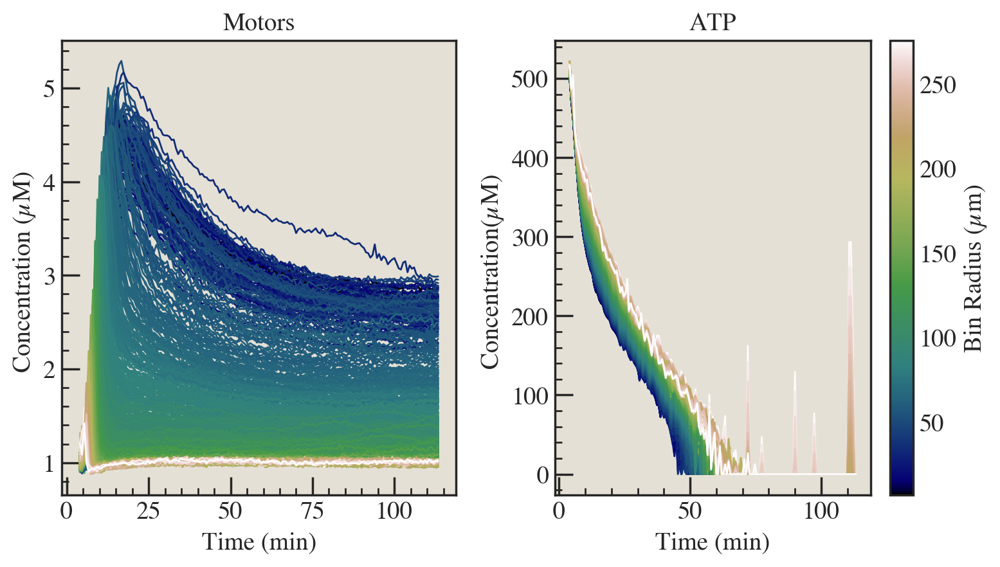

In [38]:
#FOR 2D ARRAY
# setup the normalization and the colormap
normalize = mcolors.Normalize(vmin=bin_radii_unique.min(), vmax=bin_radii_unique.max())
colormap = cm.gist_earth


fig, ax = plt.subplots(1,2)
for i in range(bins_per_axis):
    for j in range(bins_per_axis):
        ax[0].plot(bin_cherry_conc_ts['plot_times'], bin_cherry_conc_ts['bin_conc'][i][j], color = colormap(normalize(bin_radius[i][j])), linewidth = 1, alpha=1)
        ax[1].plot(bin_atp_conc_ts['plot_times'], bin_atp_conc_ts['bin_conc'][i][j], color = colormap(normalize(bin_radius[i][j])), linewidth = 1)

ax[0].set_xlabel('Time (min)')
ax[0].set_ylabel('Concentration (µM) ')
ax[0].set_title('Motors')
ax[0].set_facecolor(color_background)
ax[1].set_xlabel('Time (min)')
ax[1].set_ylabel('Concentration(µM) ')
ax[1].set_title('ATP')
ax[1].set_facecolor(color_background)
    
#setup the colorbar
scalarmappaple = cm.ScalarMappable(norm=normalize, cmap=colormap)
scalarmappaple.set_array(bin_radii_unique)
cbar = plt.colorbar(scalarmappaple, label = "Bin Radius (µm)")
#cbar.set_label('Time (s)', rotation=270)
plt.tight_layout()

### ATP Rates

In [39]:
# 2D ARRAY

bin_cherry_rates = np.zeros((bins_per_axis, bins_per_axis, frame_dim))
bin_atp_rates = np.zeros((bins_per_axis, bins_per_axis, frame_dim))

for i in range(bins_per_axis):
    for j in range(bins_per_axis):
        for time in range(len(bin_cherry_conc_ts['plot_times'])-2):
            if avg_type == 'average_bins':
                rate_cherry = -60*(bin_cherry_conc_ts['bin_conc'][i][j][time+1] - bin_cherry_conc_ts['bin_conc'][i][j][time])/(20*smooth_len)
                rate_atp = -60*(bin_atp_conc_ts['bin_conc'][i][j][time+1] - bin_atp_conc_ts['bin_conc'][i][j][time])/(20*smooth_len)
                bin_cherry_rates[i][j][time] += rate_cherry
                bin_atp_rates[i][j][time] += rate_atp
            if avg_type == 'moving_average':
                rate_cherry = -60*(bin_cherry_conc_ts['bin_conc'][i][j][time+1] - bin_cherry_conc_ts['bin_conc'][i][j][time])/20
                rate_atp = -60*(bin_atp_conc_ts['bin_conc'][i][j][time+1] - bin_atp_conc_ts['bin_conc'][i][j][time])/20
                bin_cherry_rates[i][j][time] += rate_cherry
                bin_atp_rates[i][j][time] += rate_atp
bin_cherry_conc_ts['time_deriv'] = bin_cherry_rates
bin_atp_conc_ts['time_deriv'] = bin_atp_rates

In [40]:
bin_cherry_conc_ts['time_deriv'][0][0]

array([-8.10455150e-02, -6.88710447e-01,  6.05956922e-01,  2.90335661e-01,
        5.27794648e-02, -3.88986035e-02,  3.10532727e-02, -5.58200889e-02,
        2.55148875e-02, -3.17246337e-03, -4.12262658e-02,  1.72813449e-02,
       -5.39218027e-03,  1.02775218e-03,  2.01256278e-02, -8.93480223e-03,
        1.32302285e-02, -2.76381667e-02, -2.93791071e-02,  1.16727145e-02,
       -2.56141032e-02,  2.47075424e-02, -2.60550814e-02,  1.66702120e-02,
       -5.96290164e-03, -1.04963200e-02, -2.25985147e-02,  1.05138937e-02,
       -1.28781059e-03, -2.57571696e-03,  1.75607760e-02, -2.92150496e-02,
        1.23889197e-02, -4.27941323e-02,  2.61151808e-02, -1.23826006e-03,
       -1.79561497e-02,  3.20727368e-02, -3.88200386e-02,  5.73131448e-03,
       -6.39712343e-03, -1.22877144e-02,  1.83576169e-02,  9.50988766e-03,
       -1.42444514e-02,  1.06207230e-02, -4.17453178e-02,  3.11016520e-02,
        3.44743063e-03, -9.04081600e-03,  1.59427984e-02, -1.31448682e-02,
        2.71378744e-02, -

## Consumption Term
$$\gamma*m*\frac{A/K}{1+A/K}$$

In [41]:
gamma = 30 #ATP/motor*min
K = 60 #µM

In [42]:
def consum(m, A, gamma, K):
    A_star = A/K
    return gamma*m*(A_star/(1+A_star))

In [43]:
bin_atp_conc_ts['consum'] = consum(bin_cherry_conc_ts['bin_conc'], bin_atp_conc_ts['bin_conc'], gamma, K)

Plot motor intensity vs atp rate

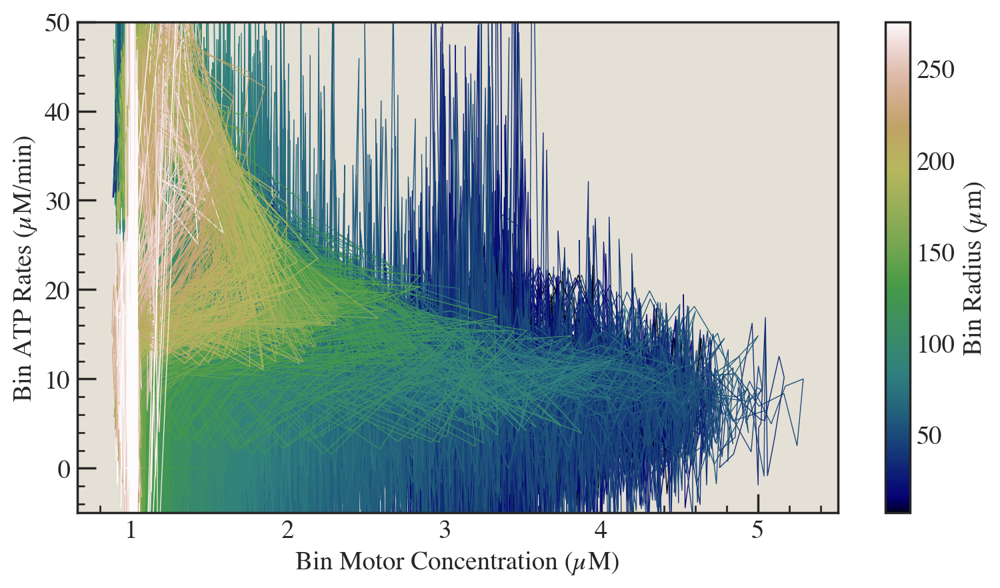

In [44]:
# setup the normalization and the colormap
normalize = mcolors.Normalize(vmin=bin_radii_unique.min(), vmax=bin_radii_unique.max())
colormap = cm.gist_earth

fig, ax = plt.subplots()
for i in range(bins_per_axis):
    for j in range(bins_per_axis):
        ax.plot(bin_cherry_conc_ts['bin_conc'][i][j], bin_atp_conc_ts['time_deriv'][i][j], linewidth = 0.5, color=colormap(normalize(bin_radius[i][j])))
        #int(smooth_len/2):int(-smooth_len/2):smooth_len
ax.set_xlabel('Bin Motor Concentration (µM)')
ax.set_ylabel('Bin ATP Rates (µM/min)')
ax.set_ylim(-5, 50)
ax.set_facecolor(color_background)
#setup the colorbar
scalarmappaple = cm.ScalarMappable(norm=normalize, cmap=colormap)
scalarmappaple.set_array(bin_radii_unique)
cbar = plt.colorbar(scalarmappaple, label = "Bin Radius (µm)")
#cbar.set_label('Time (s)', rotation=270)
plt.tight_layout()

perhaps start with getting the moving average(all points) rather than bins. see how the graphs compare. get laplacian. Check out when it is bigger vs smaller avg size. And make sure to look at trajectories. Also maybe compare with the time rates when i did it wrong by not doing (t:t+1)*smooth_len to see if looks the same.

### Laplacian

In [45]:
def laplacian(data_dict, bins_per_axis, smooth_len, plot_frames, frame_dim):
    lapla = np.zeros((bins_per_axis-2, bins_per_axis-2, frame_dim))
    data=data_dict['bin_conc']
    
    for time in range(frame_dim):
        for i in range(bins_per_axis - 2):
            for j in range(bins_per_axis - 2):
                
                i_dir = (data[i+2][j][time] + data[i][j][time] - 2*data[i+1][j][time]) / (binlen_um)**2
                j_dir = (data[i][j+2][time] + data[i][j][time] - data[i][j+1][time]) / (binlen_um)**2
                
                lapla[i][j][time] = i_dir + j_dir
    
    return lapla

In [46]:
bin_cherry_conc_ts['lapla'] = laplacian(bin_cherry_conc_ts, bins_per_axis, smooth_len, plot_frames, frame_dim)
bin_atp_conc_ts['lapla'] = laplacian(bin_atp_conc_ts, bins_per_axis, smooth_len, plot_frames, frame_dim)

In [47]:
bin_cherry_conc_ts['time_deriv'].shape

(40, 40, 165)

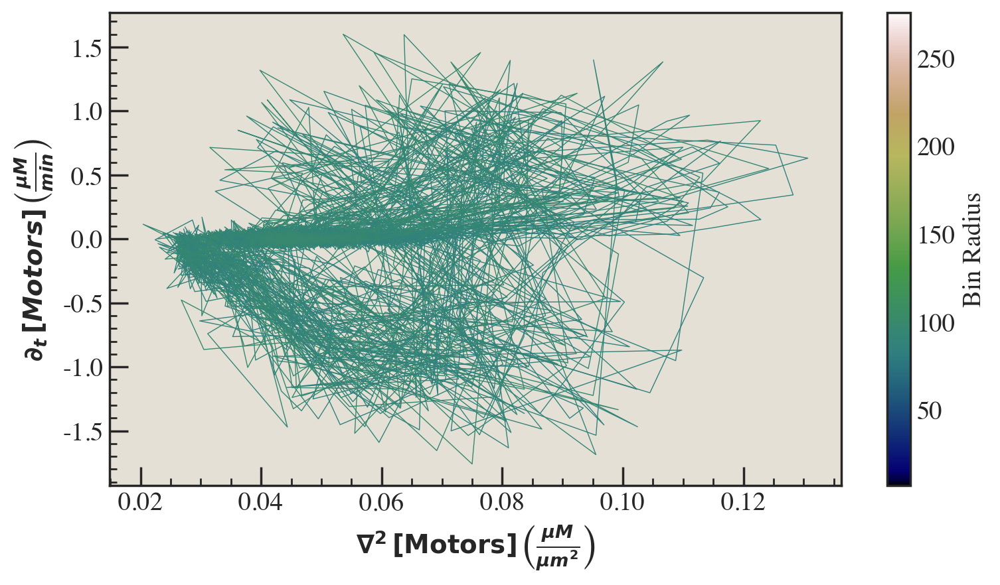

In [48]:
# setup the normalization and the colormap
normalize = mcolors.Normalize(vmin=bin_radii_unique.min(), vmax=bin_radii_unique.max())
colormap = cm.gist_earth

fig, ax = plt.subplots()
for i in range(bins_per_axis-2):
    for j in range(bins_per_axis-2):
        if bin_radius[i+1][j+1] >= 80 and bin_radius[i+1][j+1] <= 100:
            ax.plot(bin_cherry_conc_ts['lapla'][i][j], bin_cherry_conc_ts['time_deriv'][i+1][j+1], linewidth = 0.5, color=colormap(normalize(bin_radius[i+1][j+1])))
        
ax.set_xlabel( r'''$\nabla^2 \, \mathrm{[Motors]} \, \left( \frac{\mu M}{\mu m^2} \right)$''')
ax.set_ylabel(r'''$\partial_t \, [Motors] \, \left( \frac{µM}{min} \right)$''')
ax.set_facecolor(color_background)
#setup the colorbar
scalarmappaple = cm.ScalarMappable(norm=normalize, cmap=colormap)
scalarmappaple.set_array(bin_radii_unique)
cbar = plt.colorbar(scalarmappaple, label = "Bin Radius")
#cbar.set_label('Time (s)', rotation=270)
plt.tight_layout()

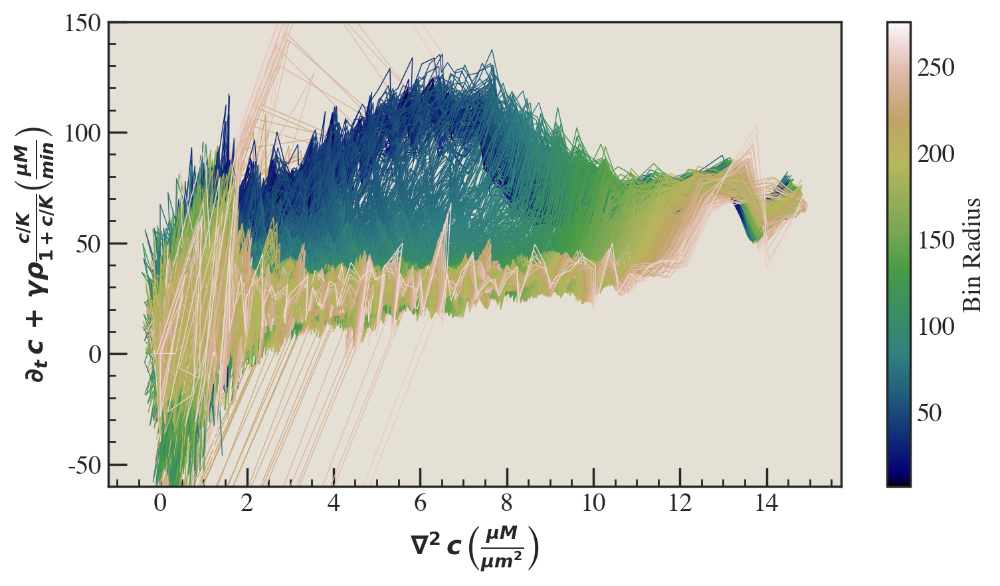

In [50]:
bin_radius_uni = np.unique(bin_radius)
np.shape(bin_cherry_conc_ts['lapla'])
np.where(bin_radius == bin_radius_uni[0])


# setup the normalization and the colormap
normalize = mcolors.Normalize(vmin=bin_radii_unique.min(), vmax=bin_radii_unique.max())
colormap = cm.gist_earth

fig, ax = plt.subplots()
for i in range(bins_per_axis-2):
    for j in range(bins_per_axis-2):
        ax.plot(bin_atp_conc_ts['lapla'][i][j], bin_atp_conc_ts['time_deriv'][i+1][j+1]+bin_atp_conc_ts['consum'][i+1][j+1], linewidth = 0.5, color=colormap(normalize(bin_radius[i+1][j+1])))

ax.set_xlabel( r'''$\nabla^2 \, c \, \left( \frac{\mu M}{\mu m^2} \right)$''')
ax.set_ylabel(r'''$\partial_t \, c \, +  \, \gamma\rho\frac{c/K}{1+c/K} \left( \frac{µM}{min} \right)$''')
ax.set_facecolor(color_background)
ax.set_ylim(-60, 150)
#setup the colorbar
scalarmappaple = cm.ScalarMappable(norm=normalize, cmap=colormap)
scalarmappaple.set_array(bin_radii_unique)
cbar = plt.colorbar(scalarmappaple, label = "Bin Radius")
#cbar.set_label('Time (s)', rotation=270)
plt.tight_layout()

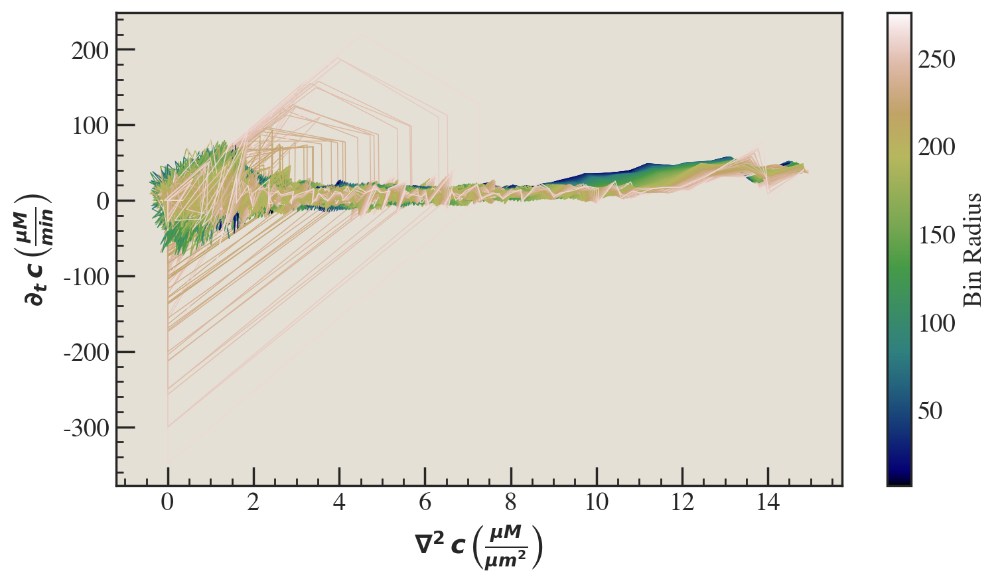

In [51]:
# setup the normalization and the colormap
normalize = mcolors.Normalize(vmin=bin_radii_unique.min(), vmax=bin_radii_unique.max())
colormap = cm.gist_earth

fig, ax = plt.subplots()
for i in range(bins_per_axis-2):
    for j in range(bins_per_axis-2):
        ax.plot(bin_atp_conc_ts['lapla'][i][j], bin_atp_conc_ts['time_deriv'][i+1][j+1], linewidth = 0.5, color=colormap(normalize(bin_radius[i+1][j+1])))
        
ax.set_xlabel( r'''$\nabla^2 \, c \, \left( \frac{\mu M}{\mu m^2} \right)$''')
ax.set_ylabel(r'''$\partial_t \, c \, \left( \frac{µM}{min} \right)$''')
ax.set_facecolor(color_background)
#setup the colorbar
scalarmappaple = cm.ScalarMappable(norm=normalize, cmap=colormap)
scalarmappaple.set_array(bin_radii_unique)
cbar = plt.colorbar(scalarmappaple, label = "Bin Radius")
#cbar.set_label('Time (s)', rotation=270)
plt.tight_layout()

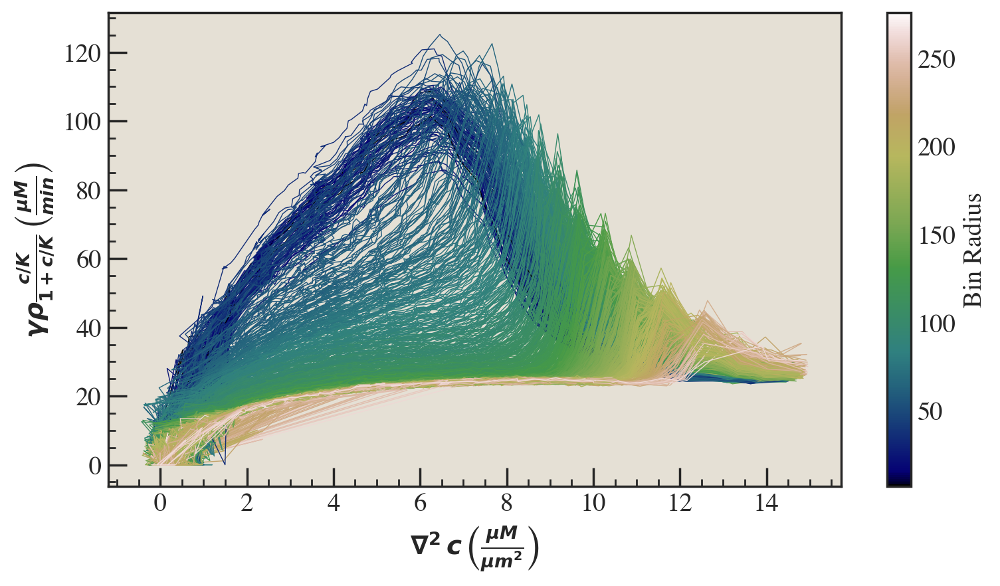

In [52]:
# setup the normalization and the colormap
normalize = mcolors.Normalize(vmin=bin_radii_unique.min(), vmax=bin_radii_unique.max())
colormap = cm.gist_earth

fig, ax = plt.subplots()
for i in range(bins_per_axis-2):
    for j in range(bins_per_axis-2):
        ax.plot(bin_atp_conc_ts['lapla'][i][j], bin_atp_conc_ts['consum'][i+1][j+1], linewidth = 0.5, color=colormap(normalize(bin_radius[i+1][j+1])))
        
ax.set_xlabel( r'''$\nabla^2 \, c \, \left( \frac{\mu M}{\mu m^2} \right)$''')
ax.set_ylabel(r'''$ \gamma\rho\frac{c/K}{1+c/K} \, \left( \frac{µM}{min} \right)$''')
ax.set_facecolor(color_background)
#setup the colorbar
scalarmappaple = cm.ScalarMappable(norm=normalize, cmap=colormap)
scalarmappaple.set_array(bin_radii_unique)
cbar = plt.colorbar(scalarmappaple, label = "Bin Radius")
#cbar.set_label('Time (s)', rotation=270)
plt.tight_layout()

## Laplacian vs....?
 - time
 - space


## DataFrame Organization

## Radial trace

### Parameters

In [53]:
r_inner = radii[100]/2
r_outer = r_inner * 2
print('r_inner: ' + str(r_inner*um_per_pixel) + ' µm, r_outer: ' +str(r_outer*um_per_pixel) + ' µm')
vmax_default = 99.9

W_half = int(0.5 * w)

r_inner: 31.984522895812987 µm, r_outer: 63.96904579162597 µm


### Helper fxns

In [54]:
def profile_fn(im,
               r_min=2.5,
               dr=1.5,
               r_max=None,
               avg_method='median',
               n_positions=100,
               n_wedge=16):
    """
    Calculate the radial intensity profile of an image, 
    assuming that the (0,0) coordinate is at the center of the image.
    
    Parameters
    ----------
    im : numpy array
        The cropped image of the aster (grayscale).
      
    r_min : float
        Minimum radius beyond which the intensity profile is calculated [px].
    
    dr : float
        Radial binning size [px].
    
    avg_method : string
        The method used for doing a radial average of intensities.
        'median' - median averaging
        'mean' - mean averaging
        
    n_positions : integer
        Number of uniformly spaced radial positions where the average
        intensity is calculated.
        
    n_wedge : integer
        Number of angular bins
        
                      
    Returns
    -------
    profile_output : dictionary
        Dictionary of different outputs listed below
    
      r_unif_ls : numpy array
          Uniformly spaced radii where the average intensity is evaluated.
          
      avg_ls : numpy array
          Average intensities evaluated at 'n_positions' different uniformly
          spaced radii.
          
      std_ls : numpy array
          Standard deviations of intensity values in differents wedges
          
      avg_bin_mat : numpy array
          Two dimensional array to store the average fluorescence values
          at each of 'n_positions' radii and for each angular bin
          
      angles : numpy array
          List of average angles at different bins. E.g., if the upper and
          lower θ-limits are (30° and 60°), then the corresponding element
          in angles will be 45°.
          
      r_ls : numpy array
          Radial distances of all image pixels from the image center.
          
      im_ls : numpy array
          All pixel intensities in the same order as 'r_ls'.
    """

    # Ensure that the image is a numpy array
    if not isinstance(im, np.ndarray):
        im = np.array(im)

    # Dimensions of the image
    H, W = im.shape

    # Array of the radial distance of each point from the center
    x_mat, y_mat = np.meshgrid(np.arange(W), np.arange(H))
    x_center = 0.5 * W - 0.5
    y_center = 0.5 * H - 0.5
    r_mat = np.sqrt((x_mat - x_center)**2 + (y_mat - y_center)**2)
    angle_mat = np.mod(np.arctan2(y_mat - y_center, x_mat - x_center),
                       2 * np.pi)

    # Convert 2d arrays into 1d arrays
    r_ls = r_mat.flatten()
    im_ls = im.flatten()
    angle_ls = angle_mat.flatten()

    # Uniformly spaced radii, starting with r_min and
    # ending with the smallest dimension of the image halved,
    # if r_max is not explicitly specified
#     if type(r_max) != np.ndarray:
#         r_max = 0.5 * np.min([H, W]) - 0.5

    r_unif_ls = np.linspace(r_min, r_max, n_positions)

    # List of bin angles
    angle_bins = np.radians(np.linspace(0, 360, n_wedge + 1))
    angles = 0.5 * (angle_bins[1:] + angle_bins[0:-1])

    # Matrix to store average profiles in each radial bin
    avg_bin_mat = [[] for _ in range(n_wedge)]

    for i, r in enumerate(r_unif_ls):
        dat = im_ls[(r_ls > r - 0.5 * dr) & (r_ls < r + 0.5 * dr)]
        angle_disk = angle_ls[(r_ls > r - 0.5 * dr) & (r_ls < r + 0.5 * dr)]

        for k in range(n_wedge):
            dat_bin = dat[(angle_disk > angle_bins[k])
                          & (angle_disk <= angle_bins[k + 1])]

            if avg_method == 'median':
                avg_dat_bin = np.median(dat_bin)
            elif avg_method == 'mean':
                avg_dat_bin = np.mean(dat_bin)
            avg_bin_mat[k].append(avg_dat_bin)

    avg_bin_mat = np.array(avg_bin_mat)
    if avg_method == 'median':
        avg_ls = np.nanmedian(avg_bin_mat, axis=0)
    elif avg_method == 'mean':
        avg_ls = np.nanmean(avg_bin_mat, axis=0)
    else:
        raise ValueError('Incorrect averaging method specified.')

    std_ls = np.std(avg_bin_mat, axis=0)

    # Keep only the points inside the disk
    im_ls = im_ls[r_ls <= r_max]
    r_ls = r_ls[r_ls <= r_max]

    profile_output = {
        "r_unif_ls": r_unif_ls,
        "r_unif_ls_um": r_unif_ls * um_per_pixel,
        "avg_ls": avg_ls,
        "std_ls": std_ls,
        "avg_bin_mat": avg_bin_mat,
        "angles": angles,
        "r_ls": r_ls,
        "im_ls": im_ls
    }

    return profile_output

### Wedge plot

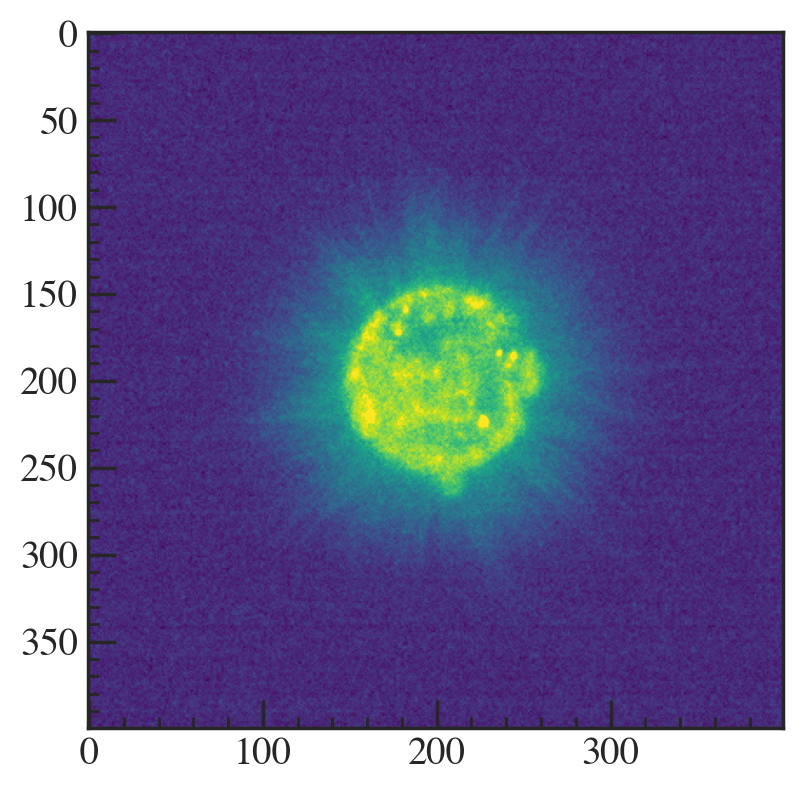

In [55]:
center = centers[100]
im = im_arrayCherryPos1_bs_norm[100][(int(center[1])-winsize): (int(center[1]) + winsize), 
                               (int(center[0])-winsize):(int(center[0])+winsize)]
im = ims_cherry_conc[100]


plt.imshow(im, vmin = np.percentile(im, 0), vmax = np.percentile(im, vmax_default))

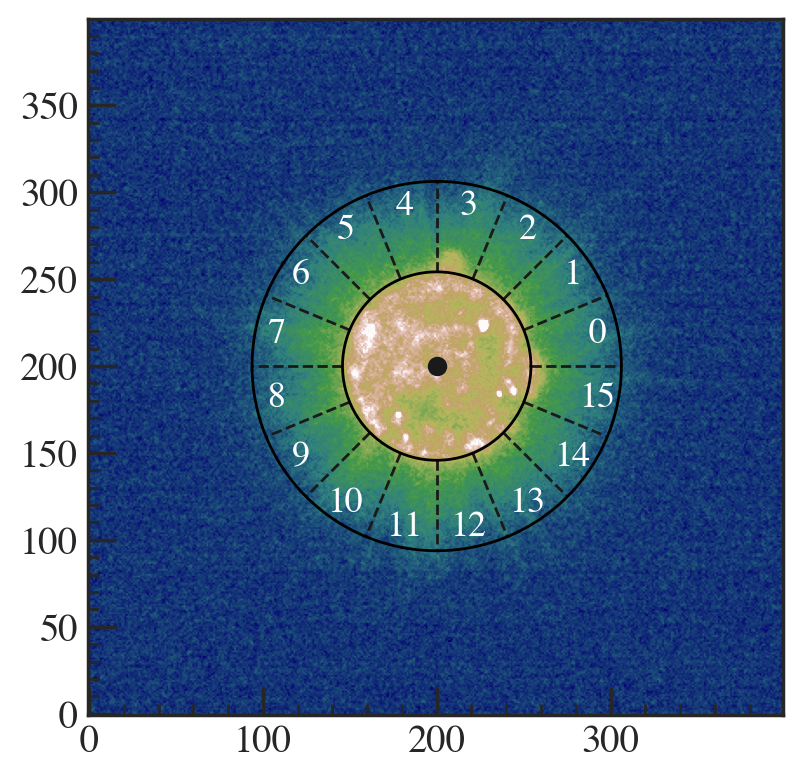

In [56]:
#######################################################################
# --------------- Show aster with boundaries & wedges --------------- #
#######################################################################

center = centers[100]
im = ims_cherry_conc[100]
plt.imshow(im, 
           origin='lower', 
#            extent = (-r_outer, r_outer, -r_outer, r_outer),
           vmin = np.percentile(im, 0), vmax = np.percentile(im, vmax_default),
           cmap = "gist_earth")

n_wedge = 16
angle_bins = np.radians(np.linspace(0,360,n_wedge+1))
angles = 0.5*(angle_bins[1:] + angle_bins[0:-1])

for i in range(len(angle_bins)-1):
    angle = angle_bins[i]
    xx = [r_inner*np.cos(angle), 0.98*r_outer*np.cos(angle)]
    yy = [r_inner*np.sin(angle), 0.98*r_outer*np.sin(angle)]
    
    xx = np.array(xx)
    yy = np.array(yy)
    
    xx += winsize
    yy += winsize
    
    plt.plot(xx, yy, '--', color='k', alpha=1, linewidth=1)

    dangle = angle_bins[1]-angle_bins[0]
    x_text = 0.87*r_outer*np.cos(angle+0.5*dangle) + winsize
    y_text = 0.87*r_outer*np.sin(angle+0.5*dangle) + winsize
    plt.text(x_text, y_text, str(i), color='w', alpha=1,
             horizontalalignment='center', verticalalignment='center')

thetas = np.linspace(0,2*np.pi,200)

x_circ_inner = r_inner*np.cos(thetas) + winsize
y_circ_inner = r_inner*np.sin(thetas) + winsize
plt.plot(x_circ_inner, y_circ_inner, color='black', alpha=1, linewidth = 1)

x_circ_outer = 0.98*r_outer*np.cos(thetas) + winsize
y_circ_outer = 0.98*r_outer*np.sin(thetas) + winsize
plt.plot(x_circ_outer, y_circ_outer, color='black', alpha=1, linewidth = 1)
plt.scatter(winsize,winsize, color="k")

### Generating profiles

In [57]:
r_inner = 0 #radii[100]/4
print(r_inner)
r_outer = 203
vmax_default = 99.9

W_half = int(0.5 * w)

0


In [58]:
# getting GFP, CFP, MT, Cherry profiles averaged across radial blocks
output_Cherry = []
output_ratios = []

num_pos = 100

avg_method_default = 'mean'

#                           r_min=radii[i],
#                           r_max=100,

for i, frame in enumerate(tqdm(frame_num)):

    prof_cherry = profile_fn(ims_cherry_conc[i],
                          r_min=r_outer,
                          r_max=r_inner,
                         avg_method=avg_method_default,
                         n_positions=num_pos)
    prof_atp = profile_fn(ratios_plot[i],
                          r_min=r_outer,
                          r_max=r_inner,
                             avg_method=avg_method_default,
                             n_positions=num_pos)
    output_Cherry.append(prof_cherry)
    output_ratios.append(prof_atp)

  0%|          | 0/331 [00:00<?, ?it/s]

/Users/anaduarte/opt/anaconda3/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3419: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/anaduarte/opt/anaconda3/lib/python3.8/site-packages/numpy/core/_methods.py:188: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


## Convert to concentration units

ATP concentration function:

Motor concentration conversion function:

### Convert intensity values to concentration

/var/folders/8p/dg75nl0d7ml8f_vqy6lvm3740000gn/T/ipykernel_41903/1203200823.py:2: RuntimeWarning: invalid value encountered in power
  return a * ((c - array) / (array - b)) ** (1/d)


  0%|          | 0/331 [00:00<?, ?it/s]

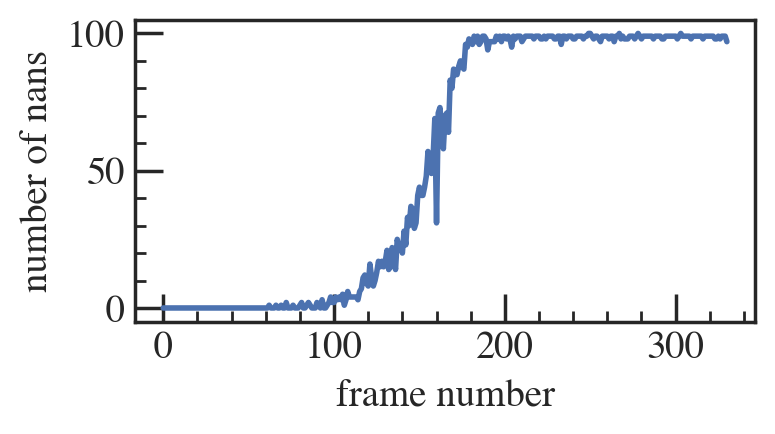

In [59]:
# convert ratios to concentration values
for i, num in enumerate(frame_num):
    ratio_conc = ATP_inten_to_conc(output_ratios[i]['avg_ls'], 742,  1.49,   0.78,   2.02)
    ratio_bin_conc = ATP_inten_to_conc(output_ratios[i]['avg_bin_mat'], 742,  1.49,   0.78,   2.02)#629, 1.44, 0.79, 2.1)
    output_ratios[i]['avg_ls_conc_units'] = ratio_conc
    output_ratios[i]['avg_bin_mat_conc_units'] = ratio_bin_conc

#---------------------------------------------#
#Convert bins of ratios to ATP concentrations. 
ims_atp = np.transpose(bin_atp_ratio)
bin_atp_conc = []
for im in tqdm(ims_atp):
    bins_conc = ATP_inten_to_conc(im, 742,  1.49,   0.78,   2.02)
    bin_atp_conc.append(bins_conc)

#--------------------------------------------------------------------#
#Plot the nans to see the distribution. If there are most nans at the end, 
#then it should be ok to set them to zero - likely the ratio is lower than 
#the calibration curve

numnan = []
for t in range(len(output_ratios)):
    num = np.sum(np.isnan(output_ratios[t]['avg_ls_conc_units']))
    numnan.append(num)

fig, ax = plt.subplots(figsize = (4,2))
ax.plot(np.arange(len(numnan)), numnan);
plt.ylabel('number of nans')
plt.xlabel('frame number')


#----------------#
#Set nans to zero
for t in range(len(output_ratios)):
    output_ratios[t]['avg_ls_conc_units'][np.isnan(output_ratios[t]['avg_ls_conc_units'])]=0

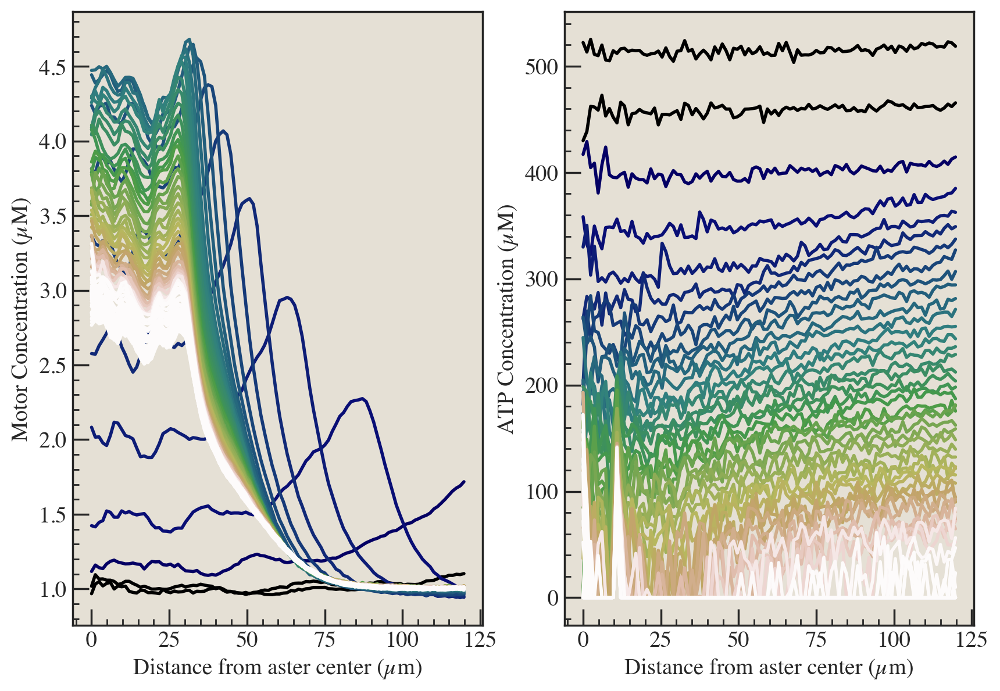

In [60]:
mod_num = 4

fig, ax = plt.subplots(1, 2, figsize=(10, 8))

# setup the normalization and the colormap
normalize = mcolors.Normalize(vmin=plot_times.min(), vmax=1.45*plot_times.max())
colormap = cm.gist_earth

for i, frame in enumerate(plot_frames):
    if i%mod_num==0:
        ax[0].plot(output_Cherry[i]['r_unif_ls_um'],
                 output_Cherry[i]['avg_ls'],
                 lw=2,
                 color = colormap(normalize(i)),
                 label=str(round(plot_times[i], 2)))

        ax[1].plot(output_ratios[i]['r_unif_ls_um'],
                 output_ratios[i]['avg_ls_conc_units'],
                 lw=2,
                 color = colormap(normalize(i)),
                 label=str(round(plot_times[i], 2)))

ax[0].set_box_aspect(1.5)
ax[1].set_box_aspect(1.5)

ax[0].set_ylabel('Motor Concentration (µM)')
ax[1].set_ylabel('ATP Concentration (µM)')
ax[0].set_xlabel('Distance from aster center (µm)')
ax[1].set_xlabel('Distance from aster center (µm)')

ax[0].set_facecolor(color_background)
ax[1].set_facecolor(color_background)

#fig.savefig('../../figures/Motor_ATP_Traces')

# Spherical Model

In [141]:
def model_core(params, x):
    # this is where the actual data is modeled 
    # x comes in as [xsize, ysize] 
    height = 70
    dz = 1 
    xcount = x[0]
    ycount = x[1]
    xsize = xcount*um_per_pixel # um 
    ysize = ycount*um_per_pixel # um 
#    xc = params['xc']
#    yc = params['yc']

    zpixels = int(round(height/dz))
    a0 = params['a0']
#    a1 = params['a1']
#    a2 = params['a2']
#    a_1 = params['a_1']
#    a_2 = params['a_2']
#    tau = params['tau']
    image = []
    for i in range(xcount):
        X = xsize*float(i)/float(xcount)
        row = []
        for j in range(ycount):
            Y = ysize*float(j)/float(ycount)
            value = 0 
            for z in range(zpixels):
                Z = height*(float(z)/zpixels-0.5)
                #R = np.sqrt((X-xc)**2 + (Y-yc)**2 + Z**2)
                #if not(R == 0):
#                    value = value + (a2*R**2 + a1*R + a0 + a_1*R**(-1) + a_2**(-2))*np.exp(R/tau)
                value = value + a0 #+ a1*np.exp(R/tau)
            row.append(value)
        image.append(np.asarray(row))
    return np.asarray(image) 
            

In [142]:
def model(params, x):
    # this is where you flatten the image as it comes out of model_core 
    # return a long 1D array 
    vec = [] 
    
    return np.ndarray.flatten(model_core(params, x))

def residual(params, x, data, uncertainty):
    thismodel = model(params, x)
    return (data-thismodel)/uncertainty 

In [143]:
params = Parameters()
#params.add('xc', value = 20*binlen_um, vary = True, min = 0, max = 40*binlen_um)
#params.add('yc', value = 20*binlen_um, vary = True, min = 0, max = 40*binlen_um)
params.add('a0', value = 1, vary = True, min = -10, max = 10)
#params.add('a1', value = 1, vary = True, min = -10, max = 10)
#params.add('a2', value = 1, vary = True, min = -10, max = 10)
#params.add('a_1', value = 1, vary = True, min = -10, max = 10)
#params.add('a_2', value = 1, vary = True, min = -10, max = 10)
#params.add('tau', value = -40, vary = True, min = -1e3, max = 0)
uncertainty = 1.0 


testim = np.transpose(bin_cherry_conc_ts['bin_conc'])[10]
out = minimize(residual, params, args=([40, 40], np.ndarray.flatten(testim), uncertainty))

print(fit_report(out))

[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 7
    # data points      = 1600
    # variables        = 1
    chi-square         = 1111.58060
    reduced chi-square = 0.69517235
    Akaike info crit   = -580.753068
    Bayesian info crit = -575.375309
[[Variables]]
    a0:  0.02080991 +/- 2.9778e-04 (1.43%) (init = 1)


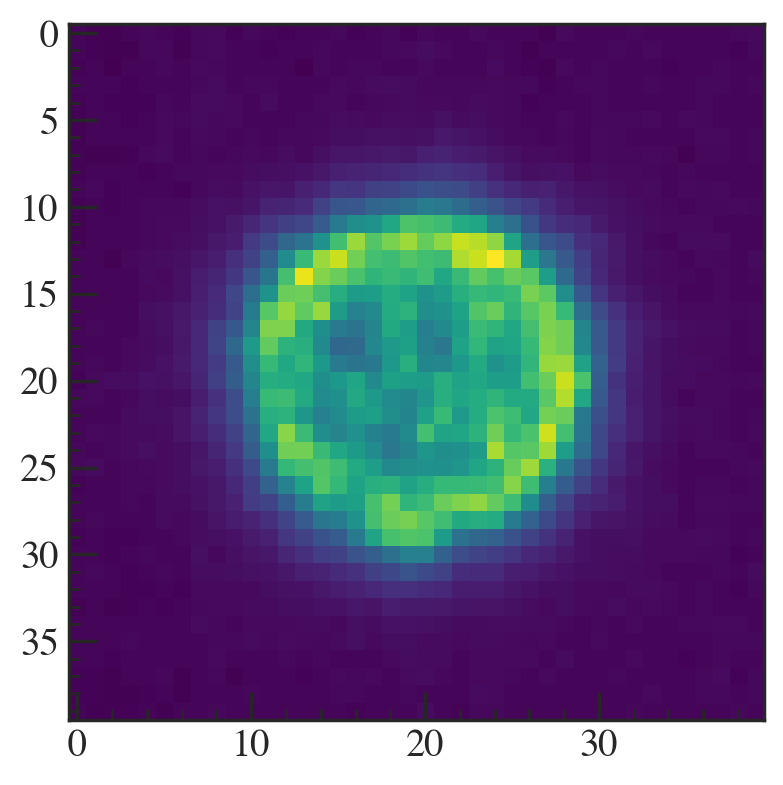

In [140]:
plt.imshow(np.transpose(bin_cherry_conc_ts['bin_conc'])[10])

In [129]:
testim.min()

0.8918531936878062

  0%|          | 0/16 [00:00<?, ?it/s]

KeyError: 'avg_bin_mat_conc_units'

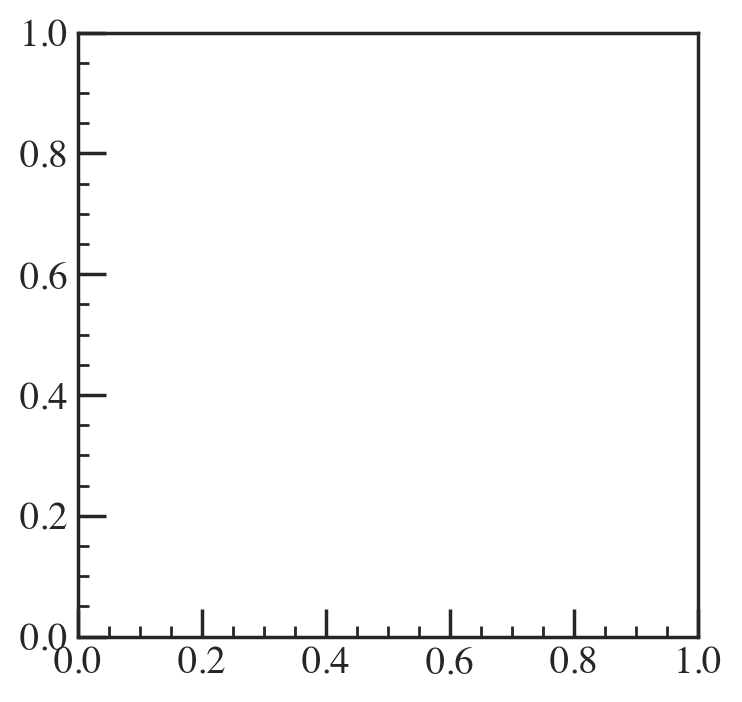

In [61]:
mod_num = 1
sector_num = np.arange(16)
im = output_Cherry[100]

fig, ax = plt.subplots(figsize=(4, 4))

# setup the normalization and the colormap
normalize = mcolors.Normalize(vmin=sector_num.min(), vmax=sector_num.max())
colormap = cm.gist_earth

for i in tqdm(range(16)):
    ax.plot(im['r_unif_ls_um'],
             im['avg_bin_mat_conc_units'][i],
             lw=0.7,
             color = colormap(normalize(i)),
             label=str(round(i, 2)))

plt.xlabel('Distance from aster center (µm)')
plt.ylabel('Motor Concentration (µM)')
ax.set_facecolor('#E5E0D5')

#setup the colorbar
scalarmappaple = cm.ScalarMappable(norm=normalize, cmap=colormap)
scalarmappaple.set_array(im['avg_bin_mat'][:][0])
cbar = plt.colorbar(scalarmappaple, label = "Bin Number")
#cbar.set_label('Time (s)', rotation=270)
plt.tight_layout()

In [ ]:
file_folder

In [ ]:
file_path = '../../data/aster/'
file_folder = '2022-06-28_NCD_ATeam_UMT/2022-06-28_NCD_ATeam_UMT_R4_1/'

im = im_arrayCherryPos1_plot
trace = output_Cherry
extent = [-winsize_um, winsize_um, -winsize_um, winsize_um]

# setup the normalization and the colormap
normalize = mcolors.Normalize(vmin=plot_times.min(), vmax=plot_times.max())
colormap1 = cm.gist_earth
colormap2 = cm.binary_r

for i, time in enumerate(tqdm(plot_times)):
    fig, ax = plt.subplots(figsize=(8, 8))

    plt.imshow(im[i],
             cmap = colormap2,
             vmin=np.percentile(im, 0.1),
             vmax=np.percentile(im, 99.9),
             extent=extent,
             label=str(round(frame, 2)))
    
    plt.gca().set_axis_off()
    plt.subplots_adjust(top = 1, bottom = 0, right = 1, left = 0, 
            hspace = 0, wspace = 0)
    plt.margins(0,0)
    plt.savefig(file_path + file_folder + pos_list[0] + "/" + "/Cherry_for_COMSOL/" + str(round(time,2)) + '.png')
    plt.close(fig)


In [ ]:
frames = [11, 25, 80]
im = im_arrayCherryPos1_plot
trace = output_Cherry
extent = [-winsize_um, winsize_um, -winsize_um, winsize_um]


fig, ax = plt.subplots(2, 3, figsize=(12, 8))

# setup the normalization and the colormap
normalize = mcolors.Normalize(vmin=plot_times.min(), vmax=plot_times.max())
colormap1 = cm.gist_earth
colormap2 = cm.binary_r


ax[0,0].imshow(im[frames[0]],
         cmap = colormap2,
         vmin=np.percentile(im, 0.1),
         vmax=np.percentile(im, 99.9),
         extent=extent,
         label=str(round(frame, 2)))

ax[1,0].plot(trace[frames[0]]['r_unif_ls_um'],
         trace[frames[0]]['avg_ls_conc_units'],
         lw=2,
         color = colormap(normalize(frames[0])),
         label=str(round(frame, 2)))
ax[1,0].set_facecolor('#E5E0D5')

ax[0,1].imshow(im[frames[1]],
         cmap = colormap2,
         vmin=np.percentile(im, 0.1),
         vmax=np.percentile(im, 99.9),
         extent=extent,
         label=str(round(frame, 2)))

ax[1,1].plot(trace[frames[1]]['r_unif_ls_um'],
         trace[frames[1]]['avg_ls_conc_units'],
         lw=2,
         color = colormap(normalize(frames[1])),
         label=str(round(frame, 2)))
ax[1,1].set_facecolor('#E5E0D5')

ax[0,2].imshow(im[frames[2]],
         cmap = colormap2,
         vmin=np.percentile(im, 0.1),
         vmax=np.percentile(im, 99.9),
         extent=extent,
         label=str(round(frame, 2)))

ax[1,2].plot(trace[frames[2]]['r_unif_ls_um'],
         trace[frames[2]]['avg_ls_conc_units'],
         lw=2,
         color = colormap(normalize(frames[2])),
         label=str(round(frame, 2)))
ax[1,2].set_facecolor('#E5E0D5')


ax[0,0].set_title(str(round(plot_times[frames[0]], 2)) + " min")
ax[0,1].set_title(str(round(plot_times[frames[1]], 2)) + " min")
ax[0,2].set_title(str(round(plot_times[frames[2]], 2)) + " min")

ax[0,0].set_ylabel('µm')
ax[1,0].set_ylabel('Motor Concentration (µM)')

ax[0,0].set_xlabel('µm')
ax[0,1].set_xlabel('µm')
ax[0,2].set_xlabel('µm')

ax[1,0].set_xlabel('Distance from aster center (µm)')
ax[1,1].set_xlabel('Distance from aster center (µm)')
ax[1,2].set_xlabel('Distance from aster center (µm)')


#setup the colorbar
scalarmappaple = cm.ScalarMappable(norm=normalize, cmap=colormap)
scalarmappaple.set_array(trace[frames[0]]['avg_bin_mat'][:][0])
#cbar = plt.colorbar(scalarmappaple, label = "Time (min)")
#cbar.set_label('Time (s)', rotation=270)
plt.tight_layout()

In [ ]:
frames = [11, 40, 60]
im = ratios_plot
trace = output_ratios
extent = [-winsize_um, winsize_um, -winsize_um, winsize_um]


fig, ax = plt.subplots(2, 3, figsize=(12, 8))

# setup the normalization and the colormap
normalize = mcolors.Normalize(vmin=plot_times.min(), vmax=plot_times.max())
colormap1 = cm.gist_earth
colormap2 = cm.binary_r


ax[0,0].imshow(im[frames[0]],
         cmap = colormap2,
         vmin=np.percentile(im, 0.1),
         vmax=np.percentile(im, 99.9),
         extent=extent,
         label=str(round(frame, 2)))

ax[1,0].plot(trace[frames[0]]['r_unif_ls_um'],
         trace[frames[0]]['avg_ls_conc_units'],
         lw=2,
         color = colormap(normalize(frames[0])),
         label=str(round(frame, 2)))
ax[1,0].set_facecolor('#E5E0D5')

ax[0,1].imshow(im[frames[1]],
         cmap = colormap2,
         vmin=np.percentile(im, 0.1),
         vmax=np.percentile(im, 99.9),
         extent=extent,
         label=str(round(frame, 2)))

ax[1,1].plot(trace[frames[1]]['r_unif_ls_um'],
         trace[frames[1]]['avg_ls_conc_units'],
         lw=2,
         color = colormap(normalize(frames[1])),
         label=str(round(frame, 2)))
ax[1,1].set_facecolor('#E5E0D5')

ax[0,2].imshow(im[frames[2]],
         cmap = colormap2,
         vmin=np.percentile(im, 0.1),
         vmax=np.percentile(im, 99.9),
         extent=extent,
         label=str(round(frame, 2)))

ax[1,2].plot(trace[frames[2]]['r_unif_ls_um'],
         trace[frames[2]]['avg_ls_conc_units'],
         lw=2,
         color = colormap(normalize(frames[2])),
         label=str(round(frame, 2)))
ax[1,2].set_facecolor('#E5E0D5')


ax[0,0].set_title(str(round(plot_times[frames[0]], 2)) + " min")
ax[0,1].set_title(str(round(plot_times[frames[1]], 2)) + " min")
ax[0,2].set_title(str(round(plot_times[frames[2]], 2)) + " min")

ax[0,0].set_ylabel('µm')
ax[1,0].set_ylabel('ATP Concentration (µM)')

ax[0,0].set_xlabel('µm')
ax[0,1].set_xlabel('µm')
ax[0,2].set_xlabel('µm')

ax[1,0].set_xlabel('Distance from aster center (µm)')
ax[1,1].set_xlabel('Distance from aster center (µm)')
ax[1,2].set_xlabel('Distance from aster center (µm)')


#setup the colorbar
scalarmappaple = cm.ScalarMappable(norm=normalize, cmap=colormap)
scalarmappaple.set_array(trace[frames[0]]['avg_bin_mat'][:][0])
#cbar = plt.colorbar(scalarmappaple, label = "Time (min)")
#cbar.set_label('Time (s)', rotation=270)
plt.tight_layout()

In [ ]:
frames = [11, 25, 60]
im_ratio = ratios_plot
trace_ratio = output_ratios
im_cherry = im_arrayCherryPos1_plot
trace_cherry = output_Cherry
extent = [-winsize_um, winsize_um, -winsize_um, winsize_um]
min_atp_val, max_atp_val = 50, 350

# setup the normalization and the colormap
normalize = mcolors.Normalize(vmin=plot_times.min(), vmax=plot_times.max())
colormap1 = cm.gist_earth
colormap2 = cm.binary_r

#set up second axis
max_cherry_val = 0
for trace in trace_cherry:
    if np.max(trace['avg_ls_conc_units']) > max_cherry_val:
        max_cherry_val = np.max(trace['avg_ls_conc_units'])

def ATP2Mot(x):
    return x * max_cherry_val / max_atp_val

def Mot2ATP(x):
    return x * max_atp_val / max_cherry_val


#Plot figure
fig, ax = plt.subplots(3, 3, figsize=(20, 12))

for i, frame in enumerate(frames):
    
    ax[i,0].imshow(im_cherry[frame],
             cmap = colormap2,
             vmin=np.percentile(im_cherry, 0.1),
             vmax=np.percentile(im_cherry, 99.9),
             extent=extent,
             label=str(round(frame, 2)))
    
    ax[i,1].imshow(im_ratio[frame],
             cmap = colormap2,
             vmin=np.percentile(im_ratio, 0.1),
             vmax=np.percentile(im_ratio, 99.9),
             extent=extent,
             label=str(round(frame, 2)))
    
    ax[i,2].plot(trace_cherry[frame]['r_unif_ls_um'],
             Mot2ATP(trace_cherry[frame]['avg_ls_conc_units']),
             lw=4,
             linestyle = '--',
             color = 'grey', #colormap(normalize(frame)),
             label='Motor Profile' )#str(round(frame, 2)))
    ax[i,2].plot(trace_ratio[frame]['r_unif_ls_um'],
             trace_ratio[frame]['avg_ls_conc_units'],
             lw=4,
             color = "grey", #colormap(normalize(frame)),
             label='ATP Profile')
   
    #legend
    ax[2,2].legend(framealpha=0, fontsize = 'large')
    
    #background color
    ax[i,2].set_facecolor('#E5E0D5')
    
    #axis/title labels
    ax[i,2].set_ylim(min_atp_val, max_atp_val)
    ax[0, i].set_title('')
    ax[i,0].set_ylabel(str(round(plot_times[frame], 2)) + ' minutes', fontsize = 'xx-large')
    ax[i,2].set_ylabel('ATP Concentration (µM)', fontsize = 18)
    ax[2,i].set_xlabel('Distance from aster center (µm)', fontsize = 'xx-large')
    secax_y = ax[i,2].secondary_yaxis('right', functions=(ATP2Mot, Mot2ATP))
    secax_y.set_ylabel('Motor Concentration (µM)', fontsize = 18)
    
    #Axis tick sizes:
    ax[0,i].tick_params('both', labelsize=20)
    ax[1,i].tick_params('both', labelsize=20)
    ax[2,i].tick_params('both', labelsize=20)
    secax_y.tick_params('both', labelsize=20)

#fig.supxlabel('Distance from aster center (µm)')
#fig.supylabel('Time (minutes)')
#plt.subplots_adjust(wspace=None, hspace=None)
#plt.subplots_adjust(wspace=-0.2, hspace=-0.2)
#plt.tight_layout()

#fig.savefig('../../figures/Motor_ATP_Contraction')

In [ ]:
ims = []
cmap = cm.get_cmap('binary_r')
colorbar_min = np.percentile(im_arrayCherryPos1_plot, 0)
colorbar_max = np.percentile(im_arrayCherryPos1_plot, 99.99)
normalizer = Normalize(colorbar_min, colorbar_max)
cb_setting = cm.ScalarMappable(norm=normalizer)
extent = [-winsize_um, winsize_um, -winsize_um, winsize_um]

fig, ax = plt.subplots()

ax.set_title("NCD Kinesin Motors")

camera = cell.Camera(fig)

for i, frame in enumerate(tqdm(frame_num[:150])):
    im_temp = im_arrayCherryPos1_plot[i]
    im = ax.imshow(im_temp,
                   vmin=colorbar_min,
                   vmax=colorbar_max,
                   cmap = cmap,
                   animated=True,
                   extent=extent,
                   zorder=0)
    ax.text(-105, 100, str(round(plot_times[frame], 2)), color = 'w')
    ax.text(-80, 100, " min", color = 'w')
    camera.snap()

plt.xlabel('µm')
plt.ylabel('µm')
    
animation = camera.animate()
#tqdm(animation.save("../../analyzed_data/aster/2022-06-28_NCD_ATeam_UMT/2022-06-28_NCD_ATeam_UMT_R4_1/Motor(a.u.)_pos1_Movie.mp4"))

  0%|          | 0/150 [00:00<?, ?it/s]

/Users/anaduarte/opt/anaconda3/lib/python3.8/site-packages/matplotlib/animation.py:973: UserWarning: Animation was deleted without rendering anything. This is most likely unintended. To prevent deletion, assign the Animation to a variable that exists for as long as you need the Animation.
  warnings.warn(


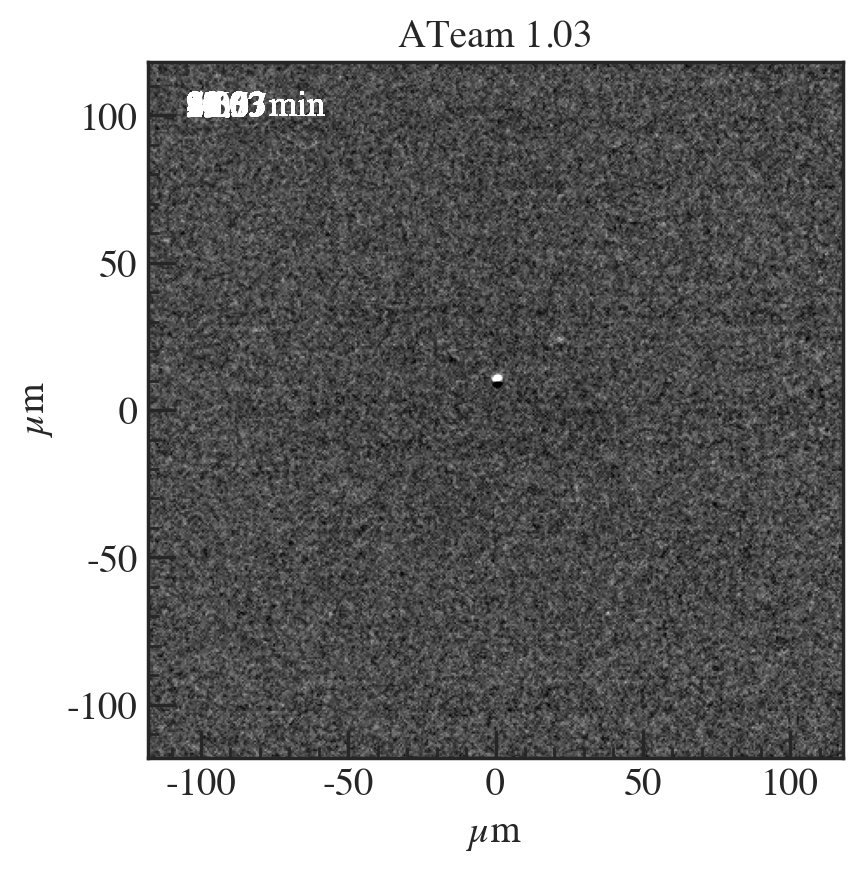

In [53]:
ims = []
cmap = cm.get_cmap('binary_r')
colorbar_min = np.percentile(ratios_plot, 0.1)
colorbar_max = np.percentile(ratios_plot, 99.9)
normalizer = Normalize(colorbar_min, colorbar_max)
cb_setting = cm.ScalarMappable(norm=normalizer)
fig, ax = plt.subplots()

ax.set_title("ATeam 1.03")

camera = cell.Camera(fig)

for i, frame in enumerate(tqdm(frame_num[:150])):
    im_temp = ratios_plot[i]
    im = ax.imshow(im_temp,
                   vmin=colorbar_min,
                   vmax=colorbar_max,
                   cmap = cmap,
                   animated=True,
                   extent = extent,
                   zorder=0)
    ax.text(-105, 100, str(round(plot_times[frame], 2)), color = 'w')
    ax.text(-80, 100, " min", color = 'w')
    camera.snap()
    
plt.xlabel('µm')
plt.ylabel('µm')
    
animation = camera.animate()
#tqdm(animation.save("../../analyzed_data/aster/2022-06-28_NCD_ATeam_UMT/2022-06-28_NCD_ATeam_UMT_R4_1/ATP(a.u.)_pos1_Movie.mp4"))